<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 32px;">
<b style="color:white">Object counting and image segmentation:<br>the case study of the MinneApple dataset</b>
</div>

<a id='contents'></a>
<div style="background-color:#3B9050; padding: 6px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Notebook contents</b>
</div>
<hr>

- [**Report**](#report)
- [**Appendices**](#appendices)
    - [**Part 1: Apple counting**](#part1)
        - [**Exploratory data analysis**](#eda1)
        - [**Models**](#models)
            - [**First model: simple CNN trained with MAE loss**](#model1)
            - [**Second model: simple CNN trained with MSE loss**](#model2)
            - [**Third model: simple CNN trained with Huber loss**](#model3)
            - [**Fourth model: MobileNet**](#model4)
            - [**Fifth model: EffectiveNetB0**](#model5)
    - [**Part 2: Apple detection**](#part2)
        - [**Exploratory data analysis**](#eda2)
        - [**Model**](#model)

<a id='report'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Report</b>
</div>

### Introduction

Agriculture is one of the growing number of areas of applications of machine learning. These applications vary from fruit and livestock counting to plant health monitoring, and the approaches range from random forests to neural networks. The problem of counting various objects using automated solutions has sparked the interest of many researchers, and there is extensive literature on this topic, e.g. see [Farjon et al. (2023)](https://link.springer.com/article/10.1007/s11119-023-10034-8).

The main **goals** of the proposed project consist in creating machine learning models for counting apples in images and segmenting images in order to detect apples. Despite the seemingly narrow scope of the project, the approaches, methods and models used in it can be applied in numerous other, more important applications such as crowd counting, livestock monitoring, insect detection and so on.

### Exploratory data analysis

The **dataset** that will be used for training and evaluating the model is the [MinneApple dataset](https://doi.org/10.13020/8ecp-3r13), which was compiled by N. Häni, P. Roy and V. Isler from the University of Minnesota as a benchmark dataset for apple detection and counting. According to the description file accompanying the dataset, it consists of three folders:

1. The `counting` folder contains images that can be used for building and testing models that count objects - apples, in this case. The files are grouped into the training, validation, and testing datasets containing 64595, 3395 and 2875 images respectively. The training and validation datasets are accompanied by a txt file that matches each image name with the true number of apples in it, whereas the test dataset does not have such a txt file. The naming conventions for the training and validation images on the one hand and the test images on the other are very different.
2. The `detection` folder contains images that can be used for building and testing models for object detection and image segmentation. The files are grouped into the training and test datasets, of which only the former contains the corresponding image segmentation masks. Somewhat confusingly, despite its name, the folder does not contain any files with information about the bounding boxes, so it can only be used for image segmentation.
3. The `test_data` folder was released a few years after the previous two folders and contains the authors' release of the test labels for counting, detection and segmentation. In contrast to the `detection` folder, the `test_data` folder does contain files with information about the bounding boxes, but since they only concern the test data, they cannot be used for training an object detection model.

The counting datasets required a fair amount of **preprocessing**. In particular, the images had to be resized, since they have various dimensions. In order to choose an appropriate image size that would not distort the proportions too much, the maximal height and width of the images were found - 516 and 441 (for each of the three datasets - training, validation and test). However, the histograms of the distributions of the height and width of the images show that these distributions are right-skewed, i.e. the majority of the values are below 150, and so smaller dimensions could be chosen. Taking into account memory allocation considerations, all images were resized to have the dimensions $128\times 128\times 3$. Besides, adaptive histogram equalization was used to improve the contrast.

In addition, the images had to be matched with the corresponding labels that were stored in a separate txt file. The above data preprocessing had to be performed before this matching, which slightly complicated the process, but the use of the Python dictionary structures allowed to create ready-to-use training, validation and test data in an efficient way.

Visual inspection of the images suggests that some basic **data augmentation** had already been performed by the compilers. However, in order to create robust models, it will be important to use more data augmentation. However, due to the nature of the tasks, not all data augmentation methods can be applied. For instance, geometric transformations such as translation, rotation and cropping can make the only part of an apple that is visible in an image to disappear, thus changing the total number of apples in it. Also, these transformations as well as flipping are not suitable for the image segmentation task, since they will lead to a mismatch between the transformed image and the mask. In contrast, color space transformations (e.g. a change of contrast and brightness) and noise injections (e.g. adding Gaussian or salt-and-pepper noise), as well as flipping for the counting task, can all be applied. These transformations will in particular make the models more robust to illumination differences in the images. It is also worth mentioning that the images were selected by the compilers to contain apples of different colors and of different levels of maturity and that in most images apples are partially occluded by other apples or leaves, so that the trained models will naturally be able to deal with such images.

The original training dataset contains more than 60000 images, which should be sufficient for training an accurate model. However, due to limited computational resources, training different models on the whole dataset for comparison was not feasible. Therefore, a subset containing 10% of the images was used, which reduced the training time enough to make the comparison of various models possible. In this connection, it is worth mentioning that the distribution of the number of apples (from 0 to 6) in the original images was uniform, and so special had to be taken in order not to introduce class imbalance when taking a subset. Therefore, a stratified train-test split performed with the help of the `train_test_split` function of the `sklearn` library.

Finally, for about 6500 training images the batch size of 32 yields a reasonable number of steps for each epoch, and so all models were trained with this batch size.

In contrast, the detection datasets are almost ready to use. It was only necessary to match the images with the corresponding masks and to reduce the number of classes of pixel values in masks to two - 'apples' and 'not apples'.

### Models

The difficulty of the tasks requires the use of **models** with high capacity, for instance, convolutional neural networks or transformers. The following models were used for the counting task:
- simple CNN trained with the MAE loss,
- simple CNN trained with the MSE loss,
- simple CNN trained with the Huber loss,
- MobileNet with a custom head,
- EfficientNetB0 with a custom head.

Since the segmentation task was not the main part of the project, only the classical UNet model was constructed and tested.

In addition to data augmentation, the following regularization techniques were used:
- dropout,
- batch normalization,
- weight regularization,
- weight decay,
- learning rate schedule,
- early stopping.

The standard dropout rate of 0.5 worked well and was used for all hidden dense layers, whereas batch normalization was used for all convolutional layers. The use of weight regularization for convolutional layers even with small parameters (between 0.001 and 0.1) made the validation MAE and MSE stagnate around 3.0 and 13.0, respectively, during training. Noting that the true values of the numbers of apples are between 0 and 6, one may argue that these values of MAE and MSE seem to suggest that the model does not learn anything; in particular, the same values can be observed when the learning rate is set too high. Taking into account this observation, weight regularization was used only with dense layers. The learning rate schedule used was the exponential decay with a relatively slow rate - the learning rate is multiplied by 0.98 at each epoch. For the early stopping, the patience parameter used was 5 epochs.

In [Hoekendijk et al. (2021)](https://www.nature.com/articles/s41598-021-02387-9), the authors observe that using the Huber loss function, which is just a slightly modified version of the MSE loss function, improves the performance of the trained counting models, so the models were trained not only with MAE and MSE, but also with the Huber loss.

The following table summarizes the main results of the experiments with simple convolutional neural network for apple counting (not all hyperparameter choices were included here to make the table more readable).

| Model | Loss function | Learning rate | Validation MAE | Validation MSE | Huber loss |
| ----- | --------------| ------------- | ----- | ----- | ---------- |
| Simple CNN | MAE | 0.1 | 3.000 | 13.000 | not used |
| Simple CNN | MAE | 0.01 | 0.859 | 1.099 | not used |
| Simple CNN | MAE | 0.005 | 0.773 | 0.895 | not used |
| Simple CNN | MAE | 0.001 | 0.822 | 0.960 | not used |
| Simple CNN | MAE | 0.0005 | 1.197 | 2.112 | not used |
| Simple CNN | MSE | 0.01 | 3.000 | 13.006 | not used |
| Simple CNN | MSE | 0.005 | 0.634 | 1.073 | not used |
| Simple CNN | MSE | 0.001 | 0.845 | 1.914 | not used |
| Simple CNN | Huber, $\delta=0.5$ | 0.005 | 0.796 | 1.065 | 0.337 |
| Simple CNN | Huber, $\delta=0.5$ | 0.001 | 0.704 | 0.987 | 0.328 |
| Simple CNN | Huber, $\delta=0.5$ | 0.0005 | 0.703 | 0.961 | 0.316 |
| Simple CNN | Huber, $\delta=0.5$ | 0.0001 | 0.864 | 1.405 | 0.783 |
| Simple CNN | Huber, $\delta=1.0$ | 0.01 | 0.747 | 0.981 | 0.465 |
| Simple CNN | Huber, $\delta=1.0$ | 0.005 | 0.711 | 0.916 | 0.451 |
| Simple CNN | Huber, $\delta=1.0$ | 0.001 | 0.725 | 1.009 | 0.510 |
| Simple CNN | Huber, $\delta=1.0$ | 0.0005 | 0.693 | 0.935 | 0.492 |

The transfer learning models used the light-weight MobileNet and EfficientNetB0 neural networks as the backbone. At the first stage of training, the backbone was frozen and only the head was trained, and the models achieved a relatively satisfactory level of precision. However, at the second stage of training, when all layers, except the batch normalization layers, were unfrozen, the MobileNet model overfitted right after the first epoch. Even the training rate of 1e-10 did not help to avoid this situation, whereas the use of weight decay with minimal rates completely prevented the model from learning. The EfficientNetB0 turned out to be better in the sense that even after unfreezing the weights it continued to train. However, even despite this, the validation errors were absolutely unreasonable. The typical results for the two models before being trained with unfrozen weights are given in the following table.

| Model | Loss function | Learning rate | Validation MAE | Validation MSE | Huber loss |
| ----- | --------------| ------------- | ----- | ----- | ---------- |
| MobileNet | Huber, $\delta=1.0$ | 0.00005 | 1.148 | 2.079 | 0.740 |
| EfficientNetB0 | Huber, $\delta=1.0$ | 0.001 | 1.541 | 3.588 | 1.106 |

(Further details and all training plots can be found below in the corresponding sections of the notebook.)

The image segmentation model is a variation of the classical UNet ([a Keras example](https://keras.io/examples/vision/oxford_pets_image_segmentation/) of how to construct and train a UNet-type neural network is available). This model is simply an extra part of the project that provided some hands-on experience with the image segmentation task, and training it takes a couple of dozens of minutes. Therefore, only basic hyperparameter fine-tuning was done in order to minimize the complexity and no comprehensive comparisons were made.

The model was trained with the sparse categorical crossentropy as the loss function, and the mean error achieved for the training dataset (no validation dataset is available) is 0.05, which is rather good.

### Conclusions and further improvements

The problem of counting objects of a certain type in an image is important for many applications, but constructing a neural network that solves it with high precision is a difficult task.

In this project, a simple convolutional neural network trained with different loss functions and more advanced architectures with pre-trained weights and custom heads were tested. In [Hoekendijk et al. (2021)](https://www.nature.com/articles/s41598-021-02387-9), it was observed that using the Huber loss leads to a better-performing model. Our experiments showed some evidence corroborating this observation, but it was not compelling. The mean error achieved by the best models was slightly less than $\pm 1$, which leaves quite some space for improvement.

Experiments with the pre-trained models showed that their precision increased at the first stage of training when the backbone model is frozen and only the head is trained. However, unfreezing the backbone made the model overfit already after the first epoch, even when very small learning rates were used.

Thus, further exploration of architectures and training methods is needed to obtain a better-performing model. In particular, the following points can be considered:
- to further fine-tune the hyperparameters such as the learning rate, the weight regularization parameter, the weight decay rate etc.;
- to increase the capacity of the models by adding more layers or units and to train on the whole training dataset of more than 60000 images;
- to use a scale-aware pyramid neural network similar to the one proposed in [Tyagi et al. (2024)](https://link.springer.com/article/10.1007/s00521-024-09572-7), since it will be able to take into account different scales of apples;
- to try other types of layers, such as [SqueezeAndExcite2D](https://keras.io/api/keras_cv/layers/regularization/squeeze_and_excite_2d/) (see [Hu et al. (2018)](https://ieeexplore.ieee.org/document/8578843), [Hu et al. (2020)](https://ieeexplore.ieee.org/document/8701503));
- to try other architectures, such as visual transformers, but, intuitively, patching images is likely to reduce the model's ability to predict the number of objects in them despite the positional encoding.

<a id='appendices'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Appendices</b>
</div>

### Imports

In [1]:
import keras
import math
import matplotlib.pyplot as plt
import numpy as np
import numpy.random as nr
import os
import pandas as pd
import skimage
import skimage.filters as skfilters
import skimage.morphology as morphology
import skimage.transform as transform
import tensorflow as tf


from keras import layers, regularizers
from skimage import data, exposure
from skimage.color import rgb2gray
from skimage.filters.rank import equalize
from sklearn.model_selection import train_test_split

In [2]:
%matplotlib inline

# Switch off GPU support, because it currently does not work well with Mac M2
tf.config.set_visible_devices([], 'GPU')

In [3]:
# Print boldface text
printbf = lambda x: print('\033[1m' + str(x) + '\033[0m')

<a id='part1'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Part 1: Apple counting</b>
</div>

<a id='eda'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Exploratory data analysis</b>
</div>

### Load and display data

In order to be able to match the images with the true numbers of apples in them that are stored in a spearate txt file, care should be taken in loading and naming the images.

In [4]:
def extract_img_name(img):
    start_ind = img.rindex('/')
    stop_ind = img.rindex('.')
    img_name = img[start_ind+1:stop_ind]
    return img_name


def extract_imgs_from_dir(dir_path):
    imgs_dict = {}
    
    for file in os.scandir(dir_path):
        img = file.path
        img_name = extract_img_name(img)
        imgs_dict[img_name] = skimage.io.imread(img, plugin='pil')
    
    return imgs_dict

In [5]:
%%time
count_train_imgs = extract_imgs_from_dir('data/counting/train/images')
count_val_imgs = extract_imgs_from_dir('data/counting/val/images')
count_test_imgs = extract_imgs_from_dir('data/counting/test/images')

CPU times: user 22.9 s, sys: 6.14 s, total: 29.1 s
Wall time: 1min 24s


In [6]:
count_train_n = len(count_train_imgs.keys())
count_val_n = len(count_val_imgs.keys())
count_test_n = len(count_test_imgs.keys())


printbf(f'Number of training images: {count_train_n}')
printbf(f'Number of validation images: {count_val_n}')
printbf(f'Number of test images: {count_test_n}')

Number of training images: 64595
Number of validation images: 3395
Number of test images: 2875


The obtained numbers of training, validation and test images agree with those mentioned in the dataset description.

Now let us display several images and inspect their dimensions.

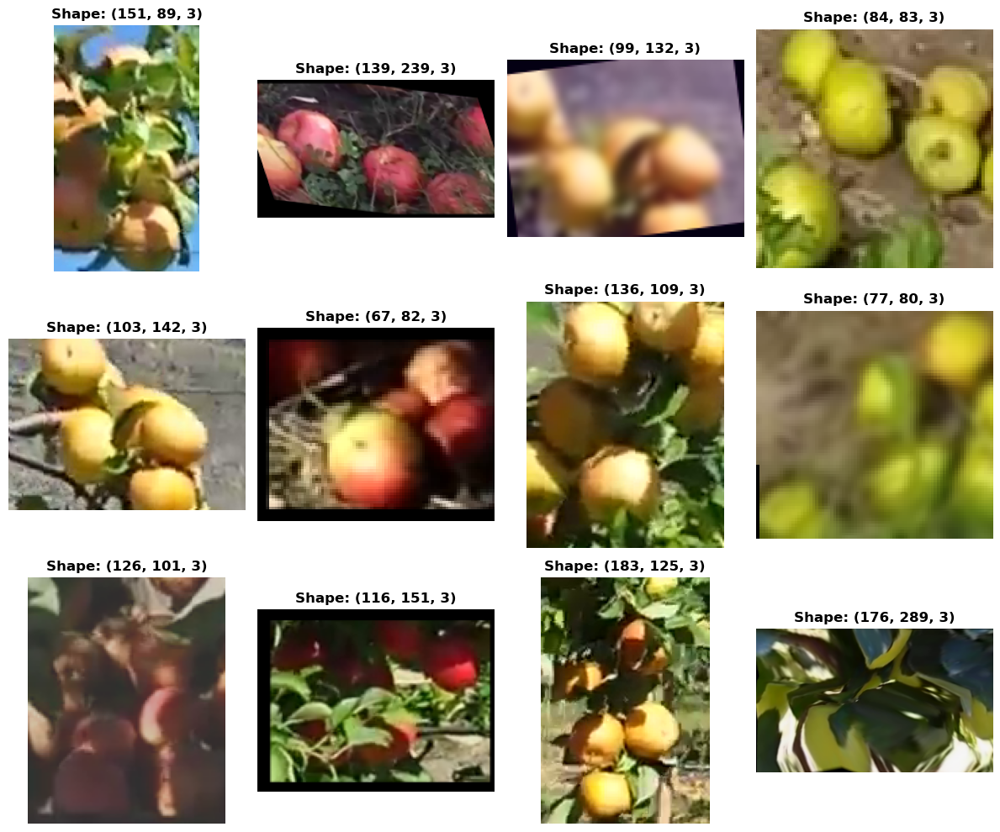

In [7]:
count_train_img_names = np.sort(list(count_train_imgs.keys()))


fig, ax = plt.subplots(3, 4, figsize=(12, 10))
ax = ax.flatten()

for i, img_name in enumerate(count_train_img_names[-12:]):
    sample_image = count_train_imgs[img_name]
    ax[i].imshow(sample_image)
    ax[i].axis('off')
    ax[i].set_title(f'Shape: {sample_image.shape}', fontdict={'size':12, 'weight':'bold'})

plt.tight_layout()
plt.show()

We can see that the quality and more importantly dimensions differ from image to image. This means, in particular, that they have to be resized in order to make it possible to build a model with fixed-size inputs. To determine the optimal image size, we need to inspect the distributions of heights and widths of the images and to find their maximal values.

In [8]:
def find_heights_and_widths(images):
    n = len(images)
    heights = np.empty(n, dtype='int')
    widths = np.empty(n, dtype='int')
    for i, img in enumerate(images):
        heights[i] = img.shape[0]
        widths[i] = img.shape[1]
    return heights, widths

In [9]:
count_train_heights, count_train_widths = find_heights_and_widths(list(count_train_imgs.values()))
count_val_heights, count_val_widths = find_heights_and_widths(list(count_val_imgs.values()))
count_test_heights, count_test_widths = find_heights_and_widths(list(count_test_imgs.values()))

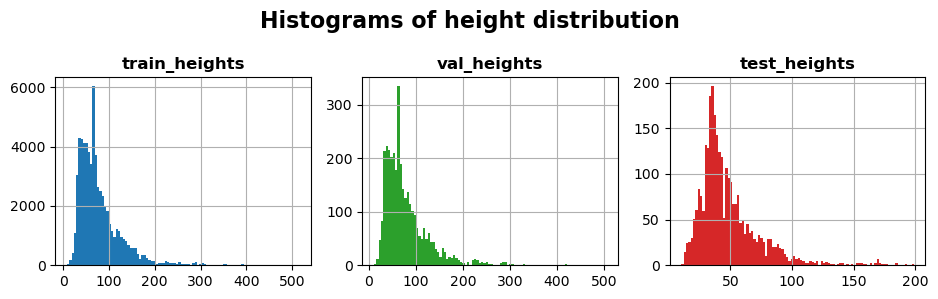

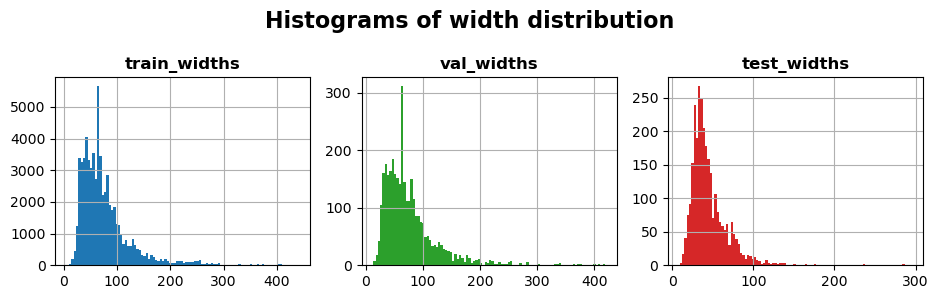

In [10]:
fig, ax = plt.subplots(1, 3, figsize=(9.5, 3))

ax[0].hist(count_train_heights, color='tab:blue', bins=100)
ax[0].grid(0.5)
ax[0].set_title('train_heights', fontdict={'size':12, 'weight':'bold'})

ax[1].hist(count_val_heights, color='tab:green', bins=100)
ax[1].grid(0.5)
ax[1].set_title('val_heights', fontdict={'size':12, 'weight':'bold'})

ax[2].hist(count_test_heights, color='tab:red', bins=100)
ax[2].grid(0.5)
ax[2].set_title('test_heights', fontdict={'size':12, 'weight':'bold'})

plt.suptitle('Histograms of height distribution', fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()


print('\n')
fig, ax = plt.subplots(1, 3, figsize=(9.5, 3))

ax[0].hist(count_train_widths, color='tab:blue', bins=100)
ax[0].grid(0.5)
ax[0].set_title('train_widths', fontdict={'size':12, 'weight':'bold'})

ax[1].hist(count_val_widths, color='tab:green', bins=100)
ax[1].grid(0.5)
ax[1].set_title('val_widths', fontdict={'size':12, 'weight':'bold'})

ax[2].hist(count_test_widths, color='tab:red', bins=100)
ax[2].grid(0.5)
ax[2].set_title('test_widths', fontdict={'size':12, 'weight':'bold'})

plt.suptitle('Histograms of width distribution', fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

In [11]:
printbf(f'Maximal training image height: {np.max(count_train_heights)}')
printbf(f'Maximal training image width: {np.max(count_train_widths)}')
print('\n')

printbf(f'Maximal validation image height: {np.max(count_train_heights)}')
printbf(f'Maximal validation image width: {np.max(count_train_widths)}')

print('\n')
printbf(f'Maximal test image height: {np.max(count_train_heights)}')
printbf(f'Maximal test image width: {np.max(count_train_widths)}')

Maximal training image height: 516
Maximal training image width: 441


Maximal validation image height: 516
Maximal validation image width: 441


Maximal test image height: 516
Maximal test image width: 441


We see that the maximal height and width of training, validation and test images are 516 and 441, respectively. However, most of the images have height and width smaller than 100. Therefore, we can take the model input dimensions to be for instance $128\times 128\times 3$, and resize all images to match these values.

In addition to resizing, during which it is important to use anti-aliasing, we will also use adaptive equalization in order to increase the contrast.

In [5]:
# The image shape that will be used in all counting models
count_shape = (128, 128, 3)

In [13]:
def preprocess_img(img, shape=count_shape):
    img = skimage.transform.resize(img, shape, anti_aliasing=True)
    img = skimage.exposure.equalize_adapthist(img)
    return img


def preprocess_imgs_dict(img_dict, shape=count_shape):
    img_dict = {k:preprocess_img(v, shape) for k, v in img_dict.items()}
    return img_dict

In [14]:
%%time
count_train_imgs = preprocess_imgs_dict(count_train_imgs)
count_val_imgs = preprocess_imgs_dict(count_val_imgs)
count_test_imgs = preprocess_imgs_dict(count_test_imgs)

CPU times: user 9min 51s, sys: 5.87 s, total: 9min 57s
Wall time: 10min 12s


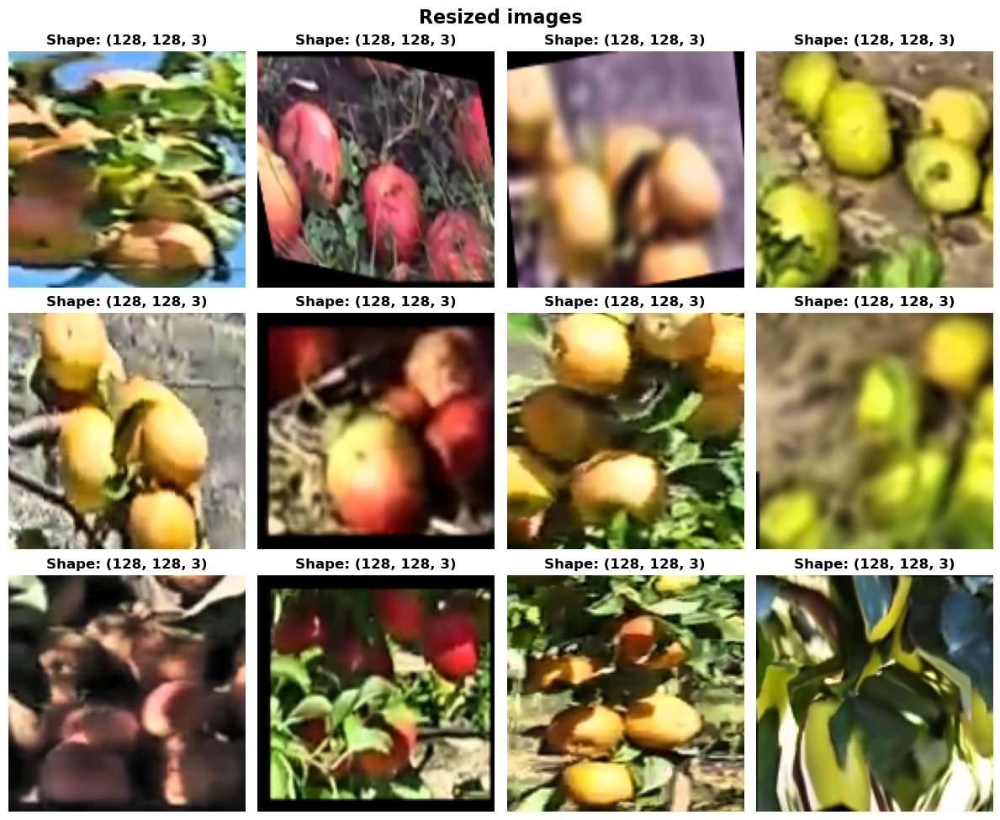

In [15]:
fig, ax = plt.subplots(3, 4, figsize=(12, 10))
ax = ax.flatten()

for i, img_name in enumerate(count_train_img_names[-12:]):
    sample_image = count_train_imgs[img_name]
    ax[i].imshow(sample_image)
    ax[i].axis('off')
    ax[i].set_title(f'Shape: {sample_image.shape}', fontdict={'size':12, 'weight':'bold'})

plt.suptitle('Resized images', fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

One can notice that cropping and rotation were already applied to some images by the compilers of the dataset. Some of the images look nice, others seem to be blurry, but the varying quality of the images may be considered an additional form of regularization of the models that will be trained on this dataset. Therefore, the images do not require further preprocessing.

### Label preparation

Now we need to extract the labels, i.e. the true numbers of apples in each image.

In [16]:
count_train_labels_df = pd.read_csv('data/counting/train/train_ground_truth.txt')
count_val_labels_df = pd.read_csv('data/counting/val/val_ground_truth.txt')

In [17]:
printbf('Training labels:')
display(count_train_labels_df.head(3))

print('\n')
printbf('Validation labels:')
display(count_val_labels_df.head(3))

Training labels:


,Image,count
0,images_00000.png,0
1,images_00001.png,0
2,images_00002.png,0




Validation labels:


,Image,count
0,images_00000.png,0
1,images_00001.png,0
2,images_00002.png,0


We will rename the columns and strip the `png` extension from the image names.

In [18]:
count_train_labels_df.rename(columns={'Image':'image'}, inplace=True)
count_val_labels_df.rename(columns={'Image':'image'}, inplace=True)


count_train_labels_df['image'] = count_train_labels_df['image'].apply(lambda x: x[:x.rindex('.')])
count_val_labels_df['image'] = count_val_labels_df['image'].apply(lambda x: x[:x.rindex('.')])

In [19]:
printbf('Training labels:')
display(count_train_labels_df.head(3))

print('\n')
printbf('Validation labels:')
display(count_val_labels_df.head(3))

Training labels:


,image,count
0,images_00000,0
1,images_00001,0
2,images_00002,0




Validation labels:


,image,count
0,images_00000,0
1,images_00001,0
2,images_00002,0


Let us also inspect the distribution of labels.

In [20]:
count_train_labels_distribution = np.unique(count_train_labels_df['count'], return_counts=True)
count_val_labels_distribution = np.unique(count_val_labels_df['count'], return_counts=True)


printbf('Training labels:')
display(pd.DataFrame(count_train_labels_distribution))

print('\n')
printbf('Validation labels:')
display(pd.DataFrame(count_val_labels_distribution))

Training labels:


,0,1,2,3,4,5,6
0,0,1,2,3,4,5,6
1,9225,9225,9225,9234,9225,9236,9225




Validation labels:


,0,1,2,3,4,5,6
0,0,1,2,3,4,5,6
1,485,485,485,485,485,485,485


We see that, apart from some deviations in the training dataset, both training and validation labels are distributed uniformly. This means that there is no class imbalance in this dataset.

### Preparation of the training and validation datasets

Now we will create the training and validation pairs of images and their labels.

In [21]:
# Create a dictionary of the form {image_name:number_of_apples}
count_train_labels = {count_train_labels_df.at[i, 'image']:count_train_labels_df.at[i, 'count']
                      for i in count_train_labels_df.index}
count_val_labels = {count_val_labels_df.at[i, 'image']:count_val_labels_df.at[i, 'count']
                    for i in count_val_labels_df.index}

In [22]:
def create_arrays(imgs:dict, labels:dict):
    n = len(imgs)
    img_shape = list(imgs.values())[0].shape
    
    X = np.empty(shape=(n, *img_shape), dtype='float32')
    y = np.empty(n, dtype='int')
    
    i = 0
    for k, v in imgs.items():
        X[i] = v
        y[i] = labels[k]
        i += 1
    
    return X, y

In [23]:
%%time
count_train_X, count_train_y = create_arrays(count_train_imgs, count_train_labels)
count_val_X, count_val_y = create_arrays(count_val_imgs, count_val_labels)

CPU times: user 2.35 s, sys: 21.4 s, total: 23.7 s
Wall time: 2min 15s


In [24]:
print(f'Training dataset: {count_train_X.shape}, {count_train_y.shape}')
print(f'Validation dataset: {count_val_X.shape}, {count_val_y.shape}')

Training dataset: (64595, 128, 128, 3), (64595,)
Validation dataset: (3395, 128, 128, 3), (3395,)


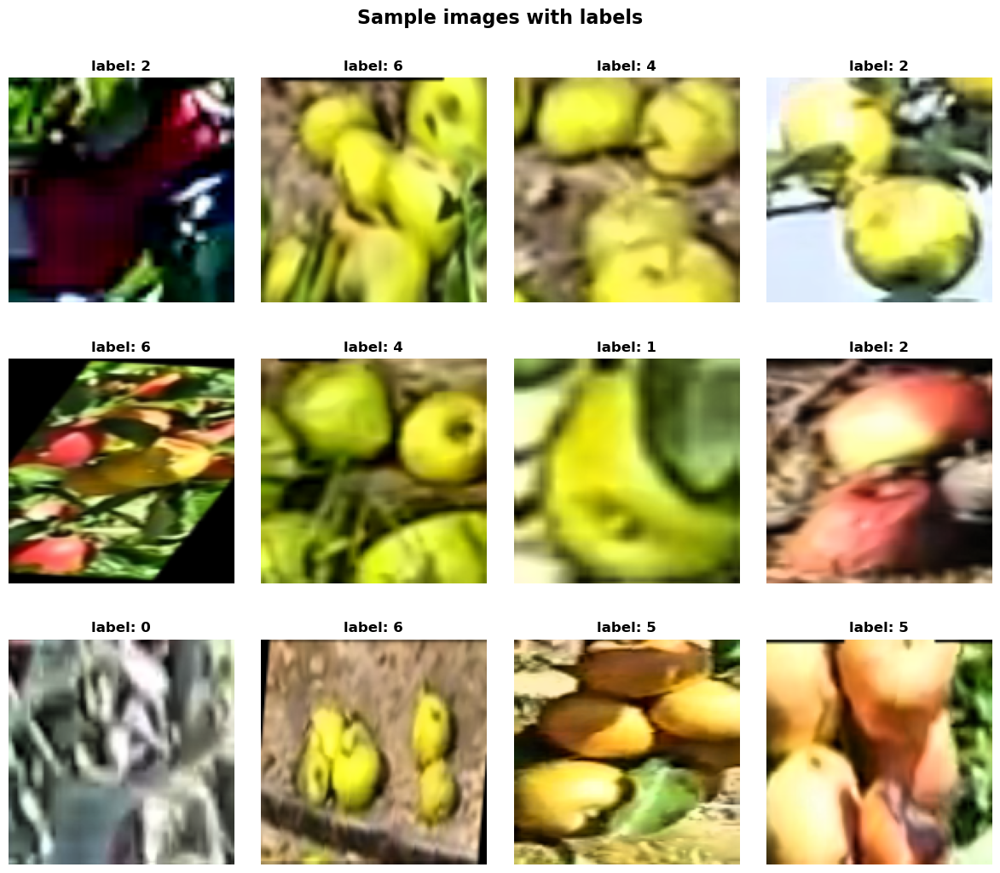

In [25]:
nr.seed(0)
random_idx = nr.choice(range(len(count_train_X)), size=12, replace=False)


fig, ax = plt.subplots(3, 4, figsize=(12, 10))
ax = ax.flatten()

for i, idx in enumerate(random_idx):
    ax[i].imshow(count_train_X[idx])
    ax[i].axis('off')
    ax[i].set_title(f'label: {count_train_y[idx]}', fontdict={'size':12, 'weight':'bold'})

plt.suptitle('Sample images with labels', fontproperties={'size':16, 'weight':'bold'}, y=1.02)
plt.tight_layout(h_pad=5)
plt.show()

### Saving and loading numpy arrays

Loading and preprocessing the data takes a realtively large amount of time. Therefore, the created arrays are saved into separate files so that they could be loaded faster each time the experiments are carried out.

In [26]:
%%time
np.savez('saved_data/count_train_data', count_train_X=count_train_X, count_train_y=count_train_y)
np.savez('saved_data/count_val_data', count_val_X=count_val_X, count_val_y=count_val_y)

CPU times: user 2.54 s, sys: 12.2 s, total: 14.7 s
Wall time: 1min 31s


In [6]:
%%time
count_train_npzfile = np.load('saved_data/count_train_data.npz')
count_train_X = count_train_npzfile['count_train_X']
count_train_y = count_train_npzfile['count_train_y']


count_val_npzfile = np.load('saved_data/count_val_data.npz')
count_val_X = count_val_npzfile['count_val_X']
count_val_y = count_val_npzfile['count_val_y']

CPU times: user 1.88 s, sys: 3.48 s, total: 5.36 s
Wall time: 8.96 s


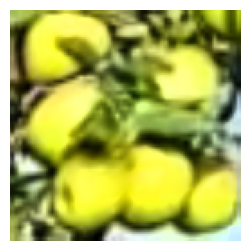

In [7]:
plt.figure(figsize=(3, 3))
plt.imshow(count_train_X[0])
plt.axis('off')
plt.show()

The number of images in the training dataset is very large for the available computational resources, and it takes a lot of time to train each model. Therefore, we will use only a part of the training dataset so that we will be able to train and compare several models. However, it is important not to introduce class imbalance, and so the `train_test_split` function of the `scikit-learn` package should be used with the `stratify` parameter.

In [8]:
%%time
count_train_X, _, count_train_y, _ = train_test_split(count_train_X, count_train_y, train_size=0.1,
                                                      random_state=0, stratify=count_train_y)

CPU times: user 1.1 s, sys: 11.6 s, total: 12.7 s
Wall time: 1min 18s


In [9]:
print(count_train_X.shape, count_train_y.shape)

print('\n')
printbf('Training labels:')
pd.DataFrame(np.unique(count_train_y, return_counts=True)).drop(index=0).reset_index(drop=True)

(6459, 128, 128, 3) (6459,)


Training labels:


,0,1,2,3,4,5,6
0,923,922,923,923,922,924,922


We see that all classes are equally represented in the new dataset.

### Data augmentation

In order to create a robust model, we need to increase the image variability by using various data augmentation methods, but not all such methods are applicable to the current situation. For instance, we cannot use translation, rotation and cropping for the apple counting task, since these transformations can make the only parts of an apple visible in an image disappear, thus changing the total number of apples in it. Besides, visual inspection of some of the images above makes it clear that some of these data augmentation methods were already applied by the compilers of the dataset. However, we can still apply color space transformations and noise injections.

In [10]:
data_augmentation_model = keras.models.Sequential(
    [
        layers.RandomContrast(factor=0.05),
        layers.RandomBrightness(factor=0.05, value_range=[0.0, 1.0]),
        layers.GaussianNoise(stddev=0.05),
        layers.Lambda(lambda x: np.clip(x, 0, 1)),
        layers.RandomFlip()
    ]
)


def data_augmentation(images):
    if len(images.shape) == 3:
        images = np.expand_dims(images, axis=0)
    
    images = data_augmentation_model(images, training=True)
    return images

In [11]:
%%time
count_aug_train_X = data_augmentation(count_train_X)

CPU times: user 9.84 s, sys: 9.84 s, total: 19.7 s
Wall time: 11.6 s


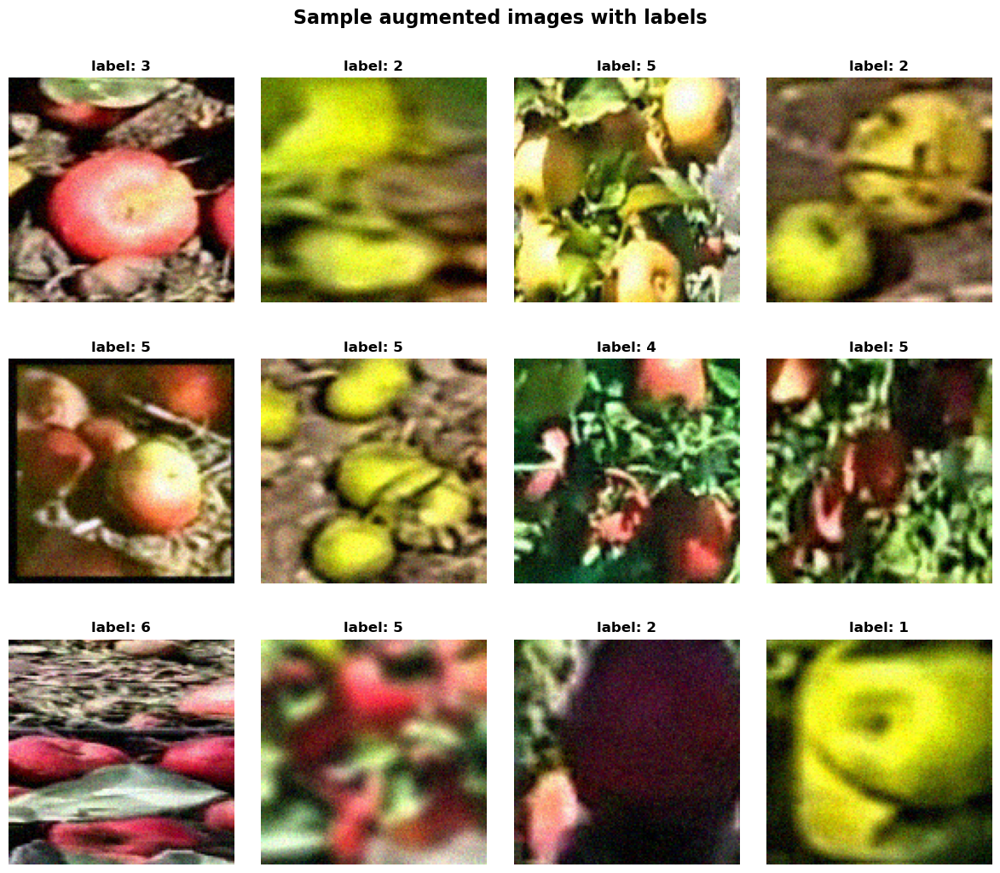

In [12]:
nr.seed(0)
random_idx = nr.choice(range(len(count_aug_train_X)), size=12, replace=False)


fig, ax = plt.subplots(3, 4, figsize=(12, 10))
ax = ax.flatten()

for i, idx in enumerate(random_idx):
    ax[i].imshow(count_aug_train_X[idx])
    ax[i].axis('off')
    ax[i].set_title(f'label: {count_train_y[idx]}', fontdict={'size':12, 'weight':'bold'})

plt.suptitle('Sample augmented images with labels', fontproperties={'size':16, 'weight':'bold'}, y=1.02)
plt.tight_layout(h_pad=5)
plt.show()

<a id='models'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Models</b>
</div>

<a id='model1'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">First model: simple CNN model with MAE loss</b>
</div>

The first model we consider is a **simple CNN model** with three convolutional layers and two hidden dense layers. Each convolutional layer is followed by a max-pooling layer and batch normalization, whereas each dense layer is followed by a dropout layer. This will add regularization to the model.

We will train the model with the MAE as the main loss, but will also monitor the MSE.

In [13]:
# L2 regularization parameter
regL2 = 0.1

# Dropout rate
dropout_rate = 0.5

In [14]:
def SimpleCNN(input_shape, model_name):
    # Input
    inputs = keras.Input(shape=input_shape, name='Input')
    
    # First convolutional layer
    x = layers.Conv2D(filters=32, kernel_size=(3, 3), padding='valid', activation='relu',
                      name='Conv2D_1')(inputs)
    x = layers.MaxPooling2D(pool_size=(2, 2), name='MaxPooling2D_1')(x)
    x = layers.BatchNormalization(name='BatchNormalization_1')(x)
    
    # Second convolutional layer
    x = layers.Conv2D(filters=64, kernel_size=(3, 3), padding='valid', activation='relu', name='Conv2D_2')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2), name='MaxPooling2D_2')(x)
    x = layers.BatchNormalization(name='BatchNormalization_2')(x)
    
    # Third convolutional layer
    x = layers.Conv2D(filters=32, kernel_size=(3, 3), padding='valid', activation='relu', name='Conv2D_3')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2), name='MaxPooling2D_3')(x)
    x = layers.BatchNormalization(name='BatchNormalization_3')(x)
    
    # Flattening and dense layers
    x = layers.Flatten(name='Flatten')(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.L2(regL2), name='Dense_1')(x)
    x = layers.Dropout(rate=dropout_rate, name='Dropout_1')(x)
    x = layers.Dense(64, activation='relu', kernel_regularizer=regularizers.L2(regL2), name='Dense_2')(x)
    x = layers.Dropout(rate=dropout_rate, name='Dropout_2')(x)
    
    # Output
    outputs = layers.Dense(1, activation='relu', name='Output')(x)
    
    # Model
    model = keras.Model(inputs=inputs, outputs=outputs, name=model_name)
    
    return model

In [19]:
count_model_1 = SimpleCNN(input_shape=count_shape, model_name='count_model_1')
count_model_1.summary()

Model: "count_model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 128, 128, 3)]     0         
                                                                 
 Conv2D_1 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 MaxPooling2D_1 (MaxPooling  (None, 63, 63, 32)        0         
 2D)                                                             
                                                                 
 BatchNormalization_1 (Batc  (None, 63, 63, 32)        128       
 hNormalization)                                                 
                                                                 
 Conv2D_2 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 MaxPooling2D_2 (MaxPooling  (None, 30, 30, 64)      

In [20]:
%%time

# Exponential decay of the learning rate
lr_scheduler = lambda epoch, lr: 0.98**epoch * lr

callbacks = [keras.callbacks.EarlyStopping(monitor='val_loss', patience=5),
             keras.callbacks.LearningRateScheduler(lr_scheduler, verbose=0),
             keras.callbacks.ModelCheckpoint('saved_models/count_model_1.h5', monitor='val_loss',
                                             save_best_only=True, save_weights_only=True)]


count_model_1.compile(optimizer=tf.keras.optimizers.legacy.Nadam(learning_rate=0.01),
                      loss='mae', metrics=['mse'])

count_history_1 = count_model_1.fit(count_aug_train_X,
                                    count_train_y,
                                    batch_size=32,
                                    epochs=50,
                                    shuffle=True,
                                    validation_data=(count_val_X, count_val_y),
                                    callbacks=callbacks,
                                    verbose=1)

Epoch 1/50
202/202 [==============================] - 28s 137ms/step - loss: 5.8546 - mse: 9.3016 - val_loss: 2.7060 - val_mse: 3.1550 - lr: 0.0100
Epoch 2/50
202/202 [==============================] - 27s 135ms/step - loss: 2.5956 - mse: 3.3255 - val_loss: 2.5759 - val_mse: 2.5929 - lr: 0.0098
Epoch 3/50
202/202 [==============================] - 28s 137ms/step - loss: 2.2858 - mse: 2.5300 - val_loss: 1.8984 - val_mse: 1.6776 - lr: 0.0094
Epoch 4/50
202/202 [==============================] - 28s 138ms/step - loss: 2.0938 - mse: 2.4240 - val_loss: 2.4323 - val_mse: 3.8875 - lr: 0.0089
Epoch 5/50
202/202 [==============================] - 27s 135ms/step - loss: 1.9788 - mse: 2.1918 - val_loss: 1.8698 - val_mse: 1.5731 - lr: 0.0082
Epoch 6/50
202/202 [==============================] - 28s 137ms/step - loss: 1.8904 - mse: 2.1312 - val_loss: 1.6927 - val_mse: 1.6740 - lr: 0.0074
Epoch 7/50
202/202 [==============================] - 28s 138ms/step - loss: 1.7574 - mse: 2.0628 - val_loss: 1.

In [21]:
def plot_loss_history(history, loss_key, loss_name, yrange=(0, 5), ax=None):
    n = len(history[loss_key])
    
    if ax != None:
        plt.sca(ax)
    else:
        plt.figure(figsize=(9.5, 4))
    
    plt.plot(range(1, n+1), history[loss_key], color='tab:blue', label='training')
    plt.plot(range(1, n+1), history['val_' + loss_key], color='tab:orange', label='validation')
    plt.grid(0.5)
    plt.ylim(yrange)
    plt.xlabel('epoch', fontdict={'size':12, 'weight':'bold'})
    plt.ylabel('loss', fontdict={'size':12, 'weight':'bold'})
    plt.title(loss_name, fontdict={'size':14, 'weight':'bold'})
    plt.legend()

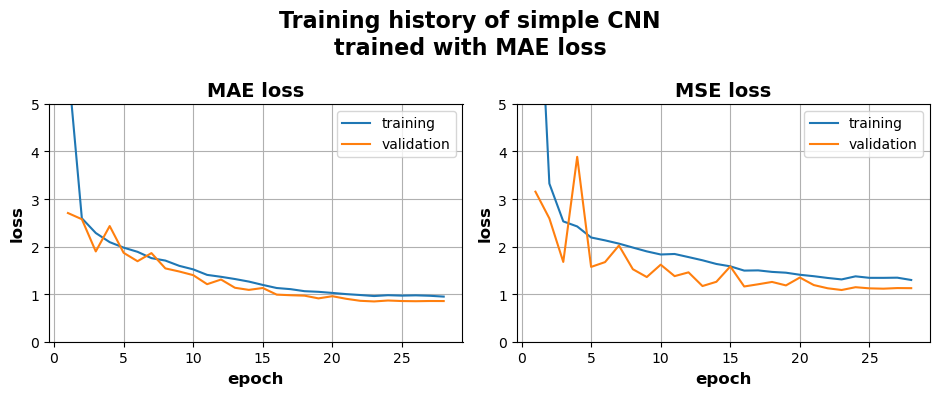

In [22]:
fig, ax = plt.subplots(1, 2, figsize=(9.5, 4))

plot_loss_history(count_history_1.history, 'loss', 'MAE loss', ax=ax[0])
plot_loss_history(count_history_1.history, 'mse', 'MSE loss', ax=ax[1])

plt.suptitle('Training history of simple CNN\ntrained with MAE loss',
             fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

In [23]:
def display_evaluation_results(model, column_names_dict):
    model_eval = model.evaluate(count_val_X, count_val_y, return_dict=True, verbose=0)
    df = pd.DataFrame(model_eval, index=[0]).rename(columns=column_names_dict).round(5)
    df = df[np.sort(df.columns)]
    display(df)

In [24]:
count_model_1.load_weights('saved_models/count_model_1.h5')

column_names_dict = {'loss':'MAE', 'mse':'MSE'}
display_evaluation_results(count_model_1, column_names_dict)

,MAE,MSE
0,0.84704,1.08753


We see that the validation MAE and MSE achieved are around 0.8 and 1.0, respectively. Taking into account the nature of the current task of counting apples, these values can be considered to be quite high, since the predicted numbers of apples will not have satisfactory accuracy: adding and subtracting 0.85 from the predicted value and rounding the reuslts can give a range of three integer numbers as possible predictions.

<a id='model2'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Second model: simple CNN model with MSE loss</b>
</div>

In [25]:
count_model_2 = SimpleCNN(input_shape=count_shape, model_name='count_model_2')
count_model_2.summary()

Model: "count_model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 128, 128, 3)]     0         
                                                                 
 Conv2D_1 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 MaxPooling2D_1 (MaxPooling  (None, 63, 63, 32)        0         
 2D)                                                             
                                                                 
 BatchNormalization_1 (Batc  (None, 63, 63, 32)        128       
 hNormalization)                                                 
                                                                 
 Conv2D_2 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 MaxPooling2D_2 (MaxPooling  (None, 30, 30, 64)      

In [26]:
%%time

# Exponential decay of the learning rate
lr_scheduler = lambda epoch, lr: 0.98**epoch * lr

callbacks = [keras.callbacks.EarlyStopping(monitor='val_loss', patience=5),
             keras.callbacks.LearningRateScheduler(lr_scheduler, verbose=0),
             keras.callbacks.ModelCheckpoint('saved_models/count_model_2.h5', monitor='val_loss',
                                             save_best_only=True, save_weights_only=True)]


count_model_2.compile(optimizer=tf.keras.optimizers.legacy.Nadam(learning_rate=0.005),
                      loss='mse', metrics=['mae'])

count_history_2 = count_model_2.fit(count_aug_train_X,
                                    count_train_y,
                                    batch_size=32,
                                    epochs=50,
                                    shuffle=True,
                                    validation_data=(count_val_X, count_val_y),
                                    callbacks=callbacks,
                                    verbose=1)

Epoch 1/50
202/202 [==============================] - 27s 132ms/step - loss: 31.7702 - mae: 2.9992 - val_loss: 20.3284 - val_mae: 3.0000 - lr: 0.0050
Epoch 2/50
202/202 [==============================] - 27s 132ms/step - loss: 20.4136 - mae: 2.7999 - val_loss: 16.9675 - val_mae: 2.5334 - lr: 0.0049
Epoch 3/50
202/202 [==============================] - 27s 132ms/step - loss: 8.0148 - mae: 1.4824 - val_loss: 10.7459 - val_mae: 2.2144 - lr: 0.0047
Epoch 4/50
202/202 [==============================] - 27s 133ms/step - loss: 4.9168 - mae: 1.2127 - val_loss: 6.4302 - val_mae: 1.6392 - lr: 0.0044
Epoch 5/50
202/202 [==============================] - 27s 132ms/step - loss: 4.0304 - mae: 1.1114 - val_loss: 5.1890 - val_mae: 1.3819 - lr: 0.0041
Epoch 6/50
202/202 [==============================] - 27s 133ms/step - loss: 3.5687 - mae: 1.0294 - val_loss: 3.3142 - val_mae: 1.0070 - lr: 0.0037
Epoch 7/50
202/202 [==============================] - 27s 133ms/step - loss: 3.4957 - mae: 0.9970 - val_los

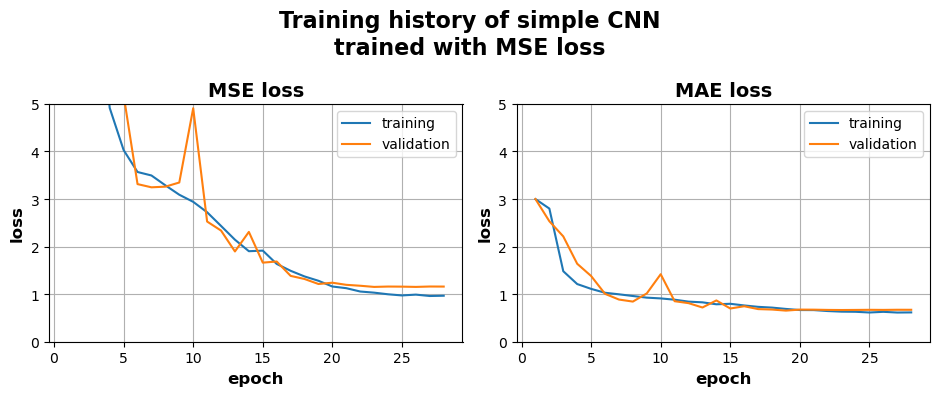

In [27]:
fig, ax = plt.subplots(1, 2, figsize=(9.5, 4))

plot_loss_history(count_history_2.history, 'loss', 'MSE loss', ax=ax[0])
plot_loss_history(count_history_2.history, 'mae', 'MAE loss', ax=ax[1])

plt.suptitle('Training history of simple CNN\ntrained with MSE loss',
             fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

In [28]:
count_model_2.load_weights('saved_models/count_model_2.h5')

column_names_dict = {'loss':'MSE', 'mae':'MAE'}
display_evaluation_results(count_model_2, column_names_dict)

,MAE,MSE
0,0.66654,1.15247


Comparing the losses of this model with those of the model considered earlier, we see that training with the MSE loss gives slightly better results in terms of MAE, but slightly worse results in terms of MSE, which looks somewhat counterintuitive.

<a id='model3'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Third model: simple CNN model trained with Huber loss</b>
</div>

In the paper [](), the authors note that the use of the so-called Huber loss during training improves the performance of a model. Therefore, we will try training the above convolutional neural network with this loss function too in order to see if there are any improvements.

The Huber loss function depends on a parameter $\delta$ and is defined as
$$
L_\delta(x)=
\begin{cases}
\dfrac{1}{2}x^2,&\text{if $|x|\leqslant\delta$},\\[1em]
\delta\left(|x|-\dfrac{1}{2}\delta\right),&\text{otherwise}.
\end{cases}
$$
Its plot for several values of $\delta$ is displayed below, together with standard quadratic loss for comparison.

The Huber loss is implemented in `scipy` as [scipy.special.huber](https://docs.scipy.org/doc/scipy/reference/generated/scipy.special.huber.html) and in `keras` as [keras.losses.Huber](https://keras.io/api/losses/regression_losses/#huber-class).

In [29]:
def Huber_loss(delta, x):
    if np.abs(x) <= delta:
        val = 1/2 * x**2
    else:
        val = delta * (np.abs(x) - 1/2 * delta)
    return val

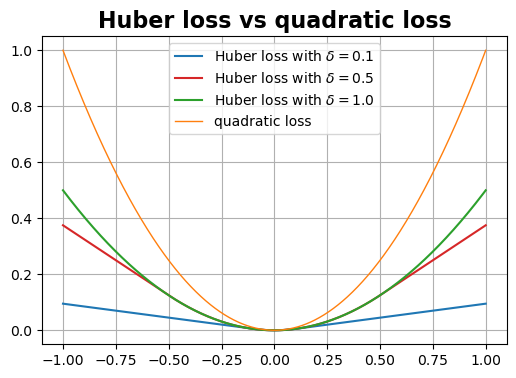

In [30]:
deltas = np.array([0.1, 0.5, 1])
colors = ['tab:blue', 'tab:red', 'tab:green']
xs = np.linspace(-1, 1, 1000)


plt.figure(figsize=(6, 4))

for delta, color in zip(deltas, colors):
    ys = np.array([Huber_loss(delta, x) for x in xs])
    plt.plot(xs, ys, color=color, label=fr'Huber loss with $\delta=${delta}')

plt.plot(xs, np.square(xs), color='tab:orange', lw=1, label='quadratic loss')
plt.grid(0.5)
plt.title('Huber loss vs quadratic loss', fontdict={'size':16, 'weight':'bold'})
plt.legend()
plt.show()

Since the target values are integer values, it is natural to first try the Huber loss with $\delta=0.5$. This is in contrast to the above paper, where the Huber loss is used with the default value $\delta=1.0$.

In [31]:
count_model_3 = SimpleCNN(input_shape=count_shape, model_name='count_model_3')
count_model_3.summary()

Model: "count_model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 128, 128, 3)]     0         
                                                                 
 Conv2D_1 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 MaxPooling2D_1 (MaxPooling  (None, 63, 63, 32)        0         
 2D)                                                             
                                                                 
 BatchNormalization_1 (Batc  (None, 63, 63, 32)        128       
 hNormalization)                                                 
                                                                 
 Conv2D_2 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 MaxPooling2D_2 (MaxPooling  (None, 30, 30, 64)      

In [32]:
%%time

# Exponential decay of the learning rate
lr_scheduler = lambda epoch, lr: 0.98**epoch * lr

callbacks = [keras.callbacks.EarlyStopping(monitor='val_loss', patience=5),
             keras.callbacks.LearningRateScheduler(lr_scheduler, verbose=0),
             keras.callbacks.ModelCheckpoint('saved_models/count_model_3.h5', monitor='val_loss',
                                             save_best_only=True, save_weights_only=True)]

Huber_delta = 0.5
count_model_3.compile(optimizer=tf.keras.optimizers.legacy.Nadam(learning_rate=0.0005),
                      loss=keras.losses.Huber(delta=Huber_delta), metrics=['mae', 'mse'])

count_history_3 = count_model_3.fit(count_aug_train_X,
                                    count_train_y,
                                    batch_size=32,
                                    epochs=50,
                                    shuffle=True,
                                    validation_data=(count_val_X, count_val_y),
                                    callbacks=callbacks,
                                    verbose=1)

Epoch 1/50
202/202 [==============================] - 28s 136ms/step - loss: 11.4764 - mae: 1.6653 - mse: 5.0744 - val_loss: 3.3379 - val_mae: 1.8487 - val_mse: 5.2546 - lr: 5.0000e-04
Epoch 2/50
202/202 [==============================] - 27s 134ms/step - loss: 1.8636 - mae: 1.2946 - mse: 3.0556 - val_loss: 1.4477 - val_mae: 1.8336 - val_mse: 5.6574 - lr: 4.9000e-04
Epoch 3/50
202/202 [==============================] - 27s 132ms/step - loss: 0.9047 - mae: 1.1820 - mse: 2.6013 - val_loss: 0.9893 - val_mae: 1.6207 - val_mse: 4.4533 - lr: 4.7060e-04
Epoch 4/50
202/202 [==============================] - 27s 134ms/step - loss: 0.6664 - mae: 1.0816 - mse: 2.1566 - val_loss: 0.8373 - val_mae: 1.4747 - val_mse: 3.8024 - lr: 4.4292e-04
Epoch 5/50
202/202 [==============================] - 27s 133ms/step - loss: 0.5987 - mae: 1.0446 - mse: 2.0096 - val_loss: 0.6429 - val_mae: 1.1560 - val_mse: 2.4639 - lr: 4.0854e-04
Epoch 6/50
202/202 [==============================] - 27s 133ms/step - loss: 0.

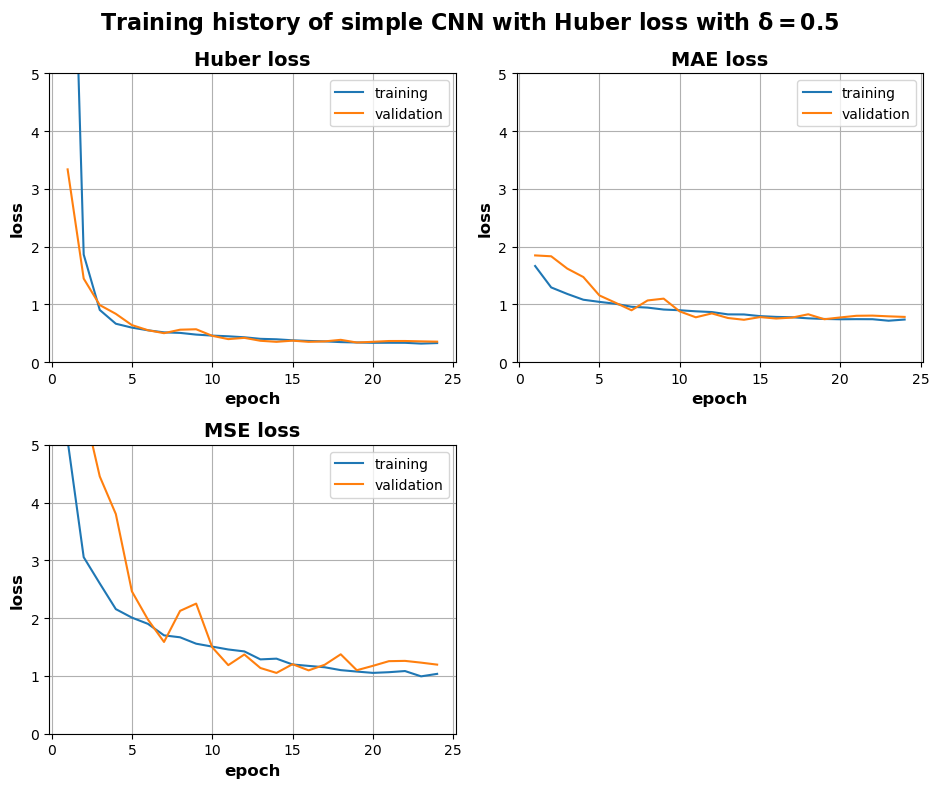

In [33]:
fig, ax = plt.subplots(2, 2, figsize=(9.5, 8))
ax = ax.flatten()

plot_loss_history(count_history_3.history, 'loss', 'Huber loss', ax=ax[0])
plot_loss_history(count_history_3.history, 'mae', 'MAE loss', ax=ax[1])
plot_loss_history(count_history_3.history, 'mse', 'MSE loss', ax=ax[2])
ax[3].axis('off')

plt.suptitle(r'Training history of simple CNN with Huber loss with $\mathbf{\delta=}$' + f'{Huber_delta}',
             fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

In [34]:
count_model_3.load_weights('saved_models/count_model_3.h5')

column_names_dict = {'loss':'Huber loss', 'mae':'MAE', 'mse':'MSE'}
display_evaluation_results(count_model_3, column_names_dict)

,Huber loss,MAE,MSE
0,0.34101,0.74418,1.0989


We see that the final MAE and MSE turn out to be higher than for the case when the model was trained with the MAE loss.

Let us now try training the model with the Huber loss again, but with the default value $\delta=1.0$.

In [35]:
count_model_3 = SimpleCNN(input_shape=count_shape, model_name='count_model_3')
count_model_3.summary()

Model: "count_model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 128, 128, 3)]     0         
                                                                 
 Conv2D_1 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 MaxPooling2D_1 (MaxPooling  (None, 63, 63, 32)        0         
 2D)                                                             
                                                                 
 BatchNormalization_1 (Batc  (None, 63, 63, 32)        128       
 hNormalization)                                                 
                                                                 
 Conv2D_2 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 MaxPooling2D_2 (MaxPooling  (None, 30, 30, 64)      

In [36]:
%%time

# Exponential decay of the learning rate
lr_scheduler = lambda epoch, lr: 0.98**epoch * lr

callbacks = [keras.callbacks.EarlyStopping(monitor='val_loss', patience=5),
             keras.callbacks.LearningRateScheduler(lr_scheduler, verbose=0),
             keras.callbacks.ModelCheckpoint('saved_models/count_model_3.h5', monitor='val_loss',
                                             save_best_only=True, save_weights_only=True)]

Huber_delta = 1.0
count_model_3.compile(optimizer=tf.keras.optimizers.legacy.Nadam(learning_rate=0.005),
                      loss=keras.losses.Huber(delta=Huber_delta), metrics=['mae', 'mse'])

count_history_3 = count_model_3.fit(count_aug_train_X,
                                    count_train_y,
                                    batch_size=32,
                                    epochs=50,
                                    shuffle=True,
                                    validation_data=(count_val_X, count_val_y),
                                    callbacks=callbacks,
                                    verbose=1)

Epoch 1/50
202/202 [==============================] - 28s 133ms/step - loss: 6.0856 - mae: 2.1930 - mse: 8.7636 - val_loss: 1.8924 - val_mae: 1.6054 - val_mse: 3.7104 - lr: 0.0050
Epoch 2/50
202/202 [==============================] - 26s 131ms/step - loss: 1.6222 - mae: 1.3273 - mse: 3.0627 - val_loss: 1.7725 - val_mae: 1.2901 - val_mse: 2.4005 - lr: 0.0049
Epoch 3/50
202/202 [==============================] - 26s 131ms/step - loss: 1.5172 - mae: 1.1321 - mse: 2.1386 - val_loss: 1.9358 - val_mae: 1.3222 - val_mse: 3.2377 - lr: 0.0047
Epoch 4/50
202/202 [==============================] - 27s 132ms/step - loss: 1.5000 - mae: 1.0912 - mse: 1.9607 - val_loss: 1.3144 - val_mae: 0.9669 - val_mse: 1.4391 - lr: 0.0044
Epoch 5/50
202/202 [==============================] - 27s 132ms/step - loss: 1.4168 - mae: 1.0820 - mse: 1.9199 - val_loss: 1.2624 - val_mae: 0.9407 - val_mse: 1.5387 - lr: 0.0041
Epoch 6/50
202/202 [==============================] - 27s 132ms/step - loss: 1.3408 - mae: 1.0498 - 

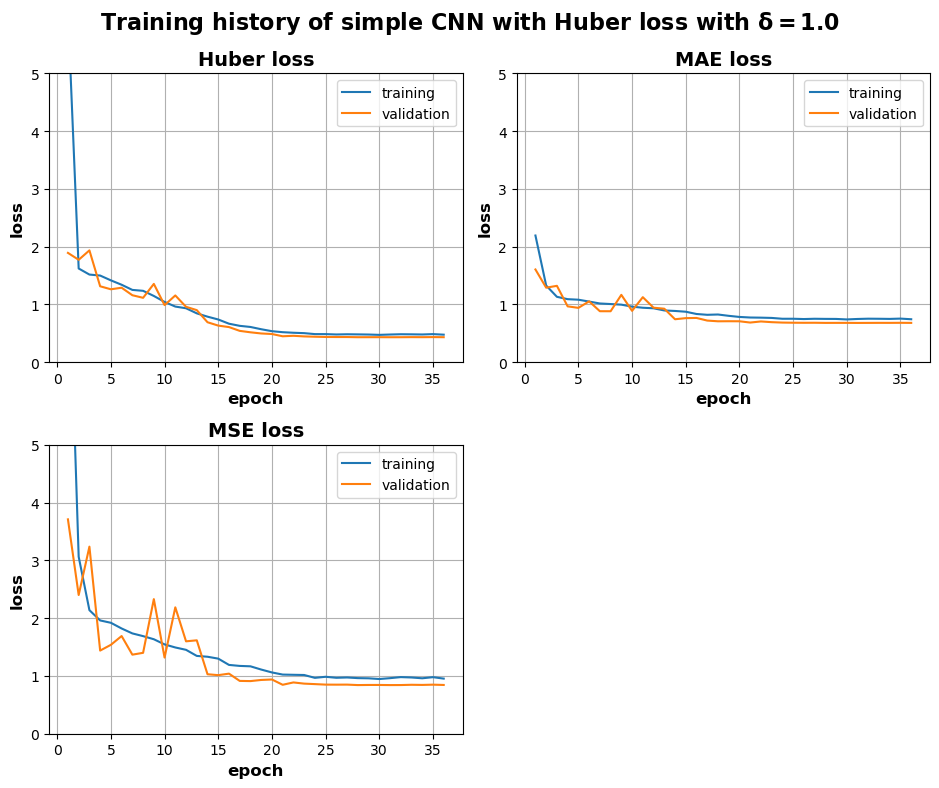

In [37]:
fig, ax = plt.subplots(2, 2, figsize=(9.5, 8))
ax = ax.flatten()

plot_loss_history(count_history_3.history, 'loss', 'Huber loss', ax=ax[0])
plot_loss_history(count_history_3.history, 'mae', 'MAE loss', ax=ax[1])
plot_loss_history(count_history_3.history, 'mse', 'MSE loss', ax=ax[2])
ax[3].axis('off')

plt.suptitle(r'Training history of simple CNN with Huber loss with $\mathbf{\delta=}$' + f'{Huber_delta}',
             fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

In [38]:
count_model_3.load_weights('saved_models/count_model_3.h5')

column_names_dict = {'loss':'Huber loss', 'mae':'MAE', 'mse':'MSE'}
display_evaluation_results(count_model_3, column_names_dict)

,Huber loss,MAE,MSE
0,0.43264,0.68007,0.84185


<a id='model4'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Fourth model: MobileNet</b>
</div>

First, we train the model with frozen weights of the backbone - the pre-trained [MobileNet](https://keras.io/api/applications/mobilenet/).

In [39]:
def MobileNet(input_shape, model_name):
    # Input
    inputs = keras.Input(shape=input_shape, name='Input')
    
    # Backbone - MobileNetV2
    backbone = keras.applications.MobileNetV2(input_shape=input_shape, include_top=False,
                                              weights='imagenet')
    backbone.trainable = False
    x = backbone(inputs)
    
    # Separable convolution to reduce dimensionality
    x = layers.SeparableConv2D(128, kernel_size=(2, 2), strides=2, name='Separable_Conv2D')(x)
    
    # Flattening and dense layers
    x = layers.Flatten(name='Flatten')(x)
    x = layers.Dense(64, activation='relu', name='Dense_1')(x)
    x = layers.Dropout(rate=0.25, name='Dropout_1')(x)
    x = layers.Dense(32, activation='relu', name='Dense_2')(x)
    x = layers.Dropout(rate=0.25, name='Dropout_2')(x)
    
    # Output
    outputs = layers.Dense(1, activation='relu', name='Output')(x)
    
    # Model
    model = keras.Model(inputs=inputs, outputs=outputs, name=model_name)
    
    return model

In [40]:
count_model_4 = MobileNet(count_shape, model_name='count_model_4')
count_model_4.summary()

Model: "count_model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 128, 128, 3)]     0         
                                                                 
 mobilenetv2_1.00_128 (Func  (None, 4, 4, 1280)        2257984   
 tional)                                                         
                                                                 
 Separable_Conv2D (Separabl  (None, 2, 2, 128)         169088    
 eConv2D)                                                        
                                                                 
 Flatten (Flatten)           (None, 512)               0         
                                                                 
 Dense_1 (Dense)             (None, 64)                32832     
                                                                 
 Dropout_1 (Dropout)         (None, 64)              

In [41]:
%%time

# Exponential decay of the learning rate
lr_scheduler = lambda epoch, lr: 0.998**epoch * lr

callbacks = [keras.callbacks.EarlyStopping(monitor='val_loss', patience=5),
             keras.callbacks.LearningRateScheduler(lr_scheduler, verbose=0),
             keras.callbacks.ModelCheckpoint('saved_models/count_model_4.h5', monitor='val_loss',
                                             save_best_only=True, save_weights_only=True)]

Huber_delta = 1.0
count_model_4.compile(optimizer=tf.keras.optimizers.legacy.Nadam(learning_rate=0.00005),
                      loss=keras.losses.Huber(delta=Huber_delta), metrics=['mae', 'mse'])

count_history_4 = count_model_4.fit(count_aug_train_X,
                                    count_train_y,
                                    batch_size=32,
                                    epochs=50,
                                    shuffle=True,
                                    validation_data=(count_val_X, count_val_y),
                                    callbacks=callbacks,
                                    verbose=1)

Epoch 1/50
202/202 [==============================] - 25s 119ms/step - loss: 1.6528 - mae: 2.0994 - mse: 6.7895 - val_loss: 1.1755 - val_mae: 1.6234 - val_mse: 3.5874 - lr: 5.0000e-05
Epoch 2/50
202/202 [==============================] - 24s 118ms/step - loss: 1.0216 - mae: 1.4517 - mse: 3.2622 - val_loss: 0.9320 - val_mae: 1.3639 - val_mse: 2.6783 - lr: 4.9900e-05
Epoch 3/50
202/202 [==============================] - 24s 117ms/step - loss: 0.8794 - mae: 1.2936 - mse: 2.7611 - val_loss: 0.8217 - val_mae: 1.2407 - val_mse: 2.3299 - lr: 4.9701e-05
Epoch 4/50
202/202 [==============================] - 23s 116ms/step - loss: 0.7882 - mae: 1.1902 - mse: 2.3865 - val_loss: 0.7415 - val_mae: 1.1516 - val_mse: 2.0642 - lr: 4.9403e-05
Epoch 5/50
202/202 [==============================] - 23s 116ms/step - loss: 0.7572 - mae: 1.1513 - mse: 2.2815 - val_loss: 0.7396 - val_mae: 1.1478 - val_mse: 2.0788 - lr: 4.9009e-05
Epoch 6/50
202/202 [==============================] - 23s 114ms/step - loss: 0.7

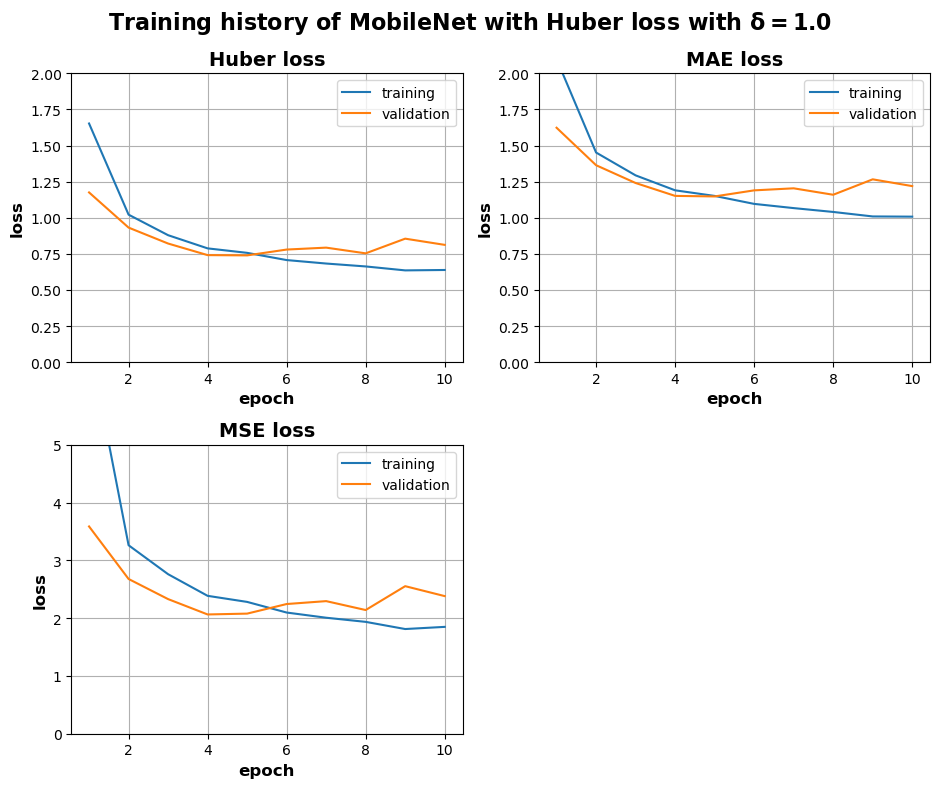

In [42]:
fig, ax = plt.subplots(2, 2, figsize=(9.5, 8))
ax = ax.flatten()

plot_loss_history(count_history_4.history, 'loss', 'Huber loss', yrange=(0, 2), ax=ax[0])
plot_loss_history(count_history_4.history, 'mae', 'MAE loss', yrange=(0, 2), ax=ax[1])
plot_loss_history(count_history_4.history, 'mse', 'MSE loss', ax=ax[2])
ax[3].axis('off')

plt.suptitle(r'Training history of MobileNet with Huber loss with $\mathbf{\delta=}$' + f'{Huber_delta}',
             fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

In [43]:
count_model_4.load_weights('saved_models/count_model_4.h5')

column_names_dict = {'loss':'Huber loss', 'mae':'MAE', 'mse':'MSE'}
display_evaluation_results(count_model_4, column_names_dict)

,Huber loss,MAE,MSE
0,0.73963,1.14776,2.07876


Next, we unfreeze the backbone, except for the batch normalization layers, and decrease the learning rate.

In [44]:
%%time

# Unfreezing layers except BatchNormalization
for layer in count_model_4.layers:
    if not isinstance(layer, layers.BatchNormalization):
        layer.trainable = True


# Exponential decay of the learning rate
lr_scheduler = lambda epoch, lr: 0.998**epoch * lr

callbacks = [keras.callbacks.EarlyStopping(monitor='val_loss', patience=5),
             keras.callbacks.LearningRateScheduler(lr_scheduler, verbose=0),
             keras.callbacks.ModelCheckpoint('saved_models/count_model_4.h5', monitor='val_loss',
                                             save_best_only=True, save_weights_only=True)]


Huber_delta = 1.0
count_model_4.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=1e-10),
                      loss=keras.losses.Huber(delta=Huber_delta), metrics=['mae', 'mse'])

count_history_4 = count_model_4.fit(count_aug_train_X,
                                    count_train_y,
                                    batch_size=32,
                                    epochs=10,
                                    shuffle=True,
                                    validation_data=(count_val_X, count_val_y),
                                    callbacks=callbacks,
                                    verbose=1)

Epoch 1/10
202/202 [==============================] - 69s 332ms/step - loss: 1.4551 - mae: 1.8900 - mse: 5.5840 - val_loss: 1.1517 - val_mae: 1.5839 - val_mse: 3.7994 - lr: 1.0000e-10
Epoch 2/10
202/202 [==============================] - 67s 332ms/step - loss: 1.4515 - mae: 1.8873 - mse: 5.5819 - val_loss: 1.3152 - val_mae: 1.7569 - val_mse: 4.5202 - lr: 9.9800e-11
Epoch 3/10
202/202 [==============================] - 65s 321ms/step - loss: 1.4508 - mae: 1.8868 - mse: 5.5589 - val_loss: 1.4327 - val_mae: 1.8773 - val_mse: 5.0910 - lr: 9.9401e-11
Epoch 4/10
202/202 [==============================] - 65s 321ms/step - loss: 1.4543 - mae: 1.8894 - mse: 5.5991 - val_loss: 1.5261 - val_mae: 1.9717 - val_mse: 5.6249 - lr: 9.8806e-11
Epoch 5/10
202/202 [==============================] - 64s 318ms/step - loss: 1.4626 - mae: 1.9014 - mse: 5.6196 - val_loss: 1.6032 - val_mae: 2.0505 - val_mse: 6.0979 - lr: 9.8018e-11
Epoch 6/10
202/202 [==============================] - 65s 321ms/step - loss: 1.4

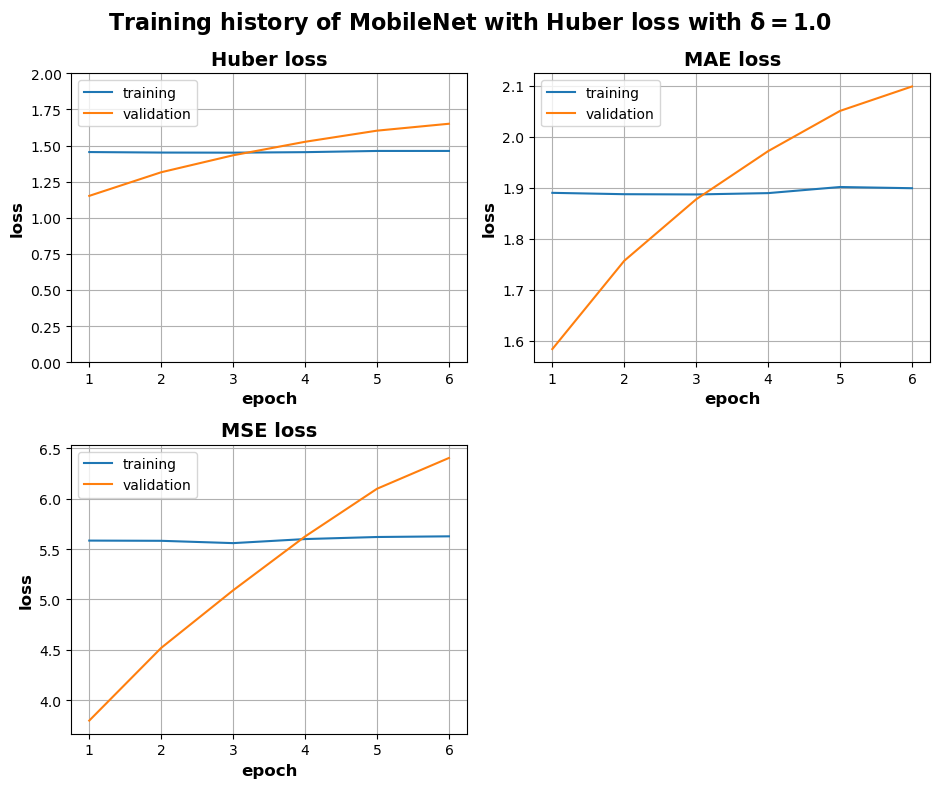

In [47]:
fig, ax = plt.subplots(2, 2, figsize=(9.5, 8))
ax = ax.flatten()

plot_loss_history(count_history_4.history, 'loss', 'Huber loss', yrange=(0, 2), ax=ax[0])
plot_loss_history(count_history_4.history, 'mae', 'MAE loss', yrange=None, ax=ax[1])
plot_loss_history(count_history_4.history, 'mse', 'MSE loss', yrange=None, ax=ax[2])
ax[3].axis('off')

plt.suptitle(r'Training history of MobileNet with Huber loss with $\mathbf{\delta=}$' + f'{Huber_delta}',
             fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

In [48]:
count_model_4.load_weights('saved_models/count_model_4.h5')

column_names_dict = {'loss':'Huber loss', 'mae':'MAE', 'mse':'MSE'}
display_evaluation_results(count_model_4, column_names_dict)

,Huber loss,MAE,MSE
0,1.1517,1.58387,3.79945


<a id='model5'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Fifth model: EfficientNetB0</b>
</div>

First, we train the model with frozen weights of the backbone - the pre-trained [EfficientNetB0](https://keras.io/api/applications/efficientnet/).

In [49]:
def EfficientNetB0(input_shape, model_name):
    # Input
    inputs = keras.Input(shape=input_shape, name='Input')
    
    # Backbone - EfficientNetB0
    backbone = keras.applications.EfficientNetB0(input_shape=input_shape, include_top=False,
                                                 weights='imagenet')
    backbone.trainable = False
    x = backbone(inputs)
    
    # Separable convolution to reduce dimensionality
    x = layers.SeparableConv2D(128, kernel_size=(2, 2), strides=2, name='Separable_Conv2D')(x)
    
    # Flattening and dense layers
    x = layers.Flatten(name='Flatten')(x)
    x = layers.Dense(64, activation='relu', name='Dense_1')(x)
    x = layers.Dropout(rate=0.25, name='Dropout_1')(x)
    x = layers.Dense(32, activation='relu', name='Dense_2')(x)
    x = layers.Dropout(rate=0.25, name='Dropout_2')(x)
    
    # Output
    outputs = layers.Dense(1, activation='relu', name='Output')(x)
    
    # Model
    model = keras.Model(inputs=inputs, outputs=outputs, name=model_name)
    
    return model

In [50]:
count_model_5 = EfficientNetB0(count_shape, model_name='count_model_5')
count_model_5.summary()

Model: "count_model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 128, 128, 3)]     0         
                                                                 
 efficientnetb0 (Functional  (None, 4, 4, 1280)        4049571   
 )                                                               
                                                                 
 Separable_Conv2D (Separabl  (None, 2, 2, 128)         169088    
 eConv2D)                                                        
                                                                 
 Flatten (Flatten)           (None, 512)               0         
                                                                 
 Dense_1 (Dense)             (None, 64)                32832     
                                                                 
 Dropout_1 (Dropout)         (None, 64)              

In [51]:
%%time

# Exponential decay of the learning rate
lr_scheduler = lambda epoch, lr: 0.998**epoch * lr

callbacks = [keras.callbacks.EarlyStopping(monitor='val_loss', patience=5),
             keras.callbacks.LearningRateScheduler(lr_scheduler, verbose=0),
             keras.callbacks.ModelCheckpoint('saved_models/count_model_5.h5', monitor='val_loss',
                                             save_best_only=True, save_weights_only=True)]

Huber_delta = 1.0
count_model_5.compile(optimizer=tf.keras.optimizers.legacy.Nadam(learning_rate=0.001),
                      loss=keras.losses.Huber(delta=Huber_delta), metrics=['mae', 'mse'])

count_history_5 = count_model_5.fit(count_aug_train_X,
                                    count_train_y,
                                    batch_size=32,
                                    epochs=50,
                                    shuffle=True,
                                    validation_data=(count_val_X, count_val_y),
                                    callbacks=callbacks,
                                    verbose=1)

Epoch 1/50
202/202 [==============================] - 41s 188ms/step - loss: 1.4135 - mae: 1.8655 - mse: 4.8946 - val_loss: 1.2829 - val_mae: 1.7243 - val_mse: 3.9939 - lr: 0.0010
Epoch 2/50
202/202 [==============================] - 39s 192ms/step - loss: 1.3618 - mae: 1.8139 - mse: 4.5517 - val_loss: 1.2745 - val_mae: 1.7067 - val_mse: 3.9610 - lr: 9.9800e-04
Epoch 3/50
202/202 [==============================] - 38s 187ms/step - loss: 1.3441 - mae: 1.7953 - mse: 4.4525 - val_loss: 1.2801 - val_mae: 1.7391 - val_mse: 4.0228 - lr: 9.9401e-04
Epoch 4/50
202/202 [==============================] - 38s 188ms/step - loss: 1.3340 - mae: 1.7849 - mse: 4.4251 - val_loss: 1.2483 - val_mae: 1.6950 - val_mse: 3.8779 - lr: 9.8806e-04
Epoch 5/50
202/202 [==============================] - 37s 182ms/step - loss: 1.3061 - mae: 1.7557 - mse: 4.2949 - val_loss: 1.2265 - val_mae: 1.6682 - val_mse: 3.8421 - lr: 9.8018e-04
Epoch 6/50
202/202 [==============================] - 37s 182ms/step - loss: 1.2835 

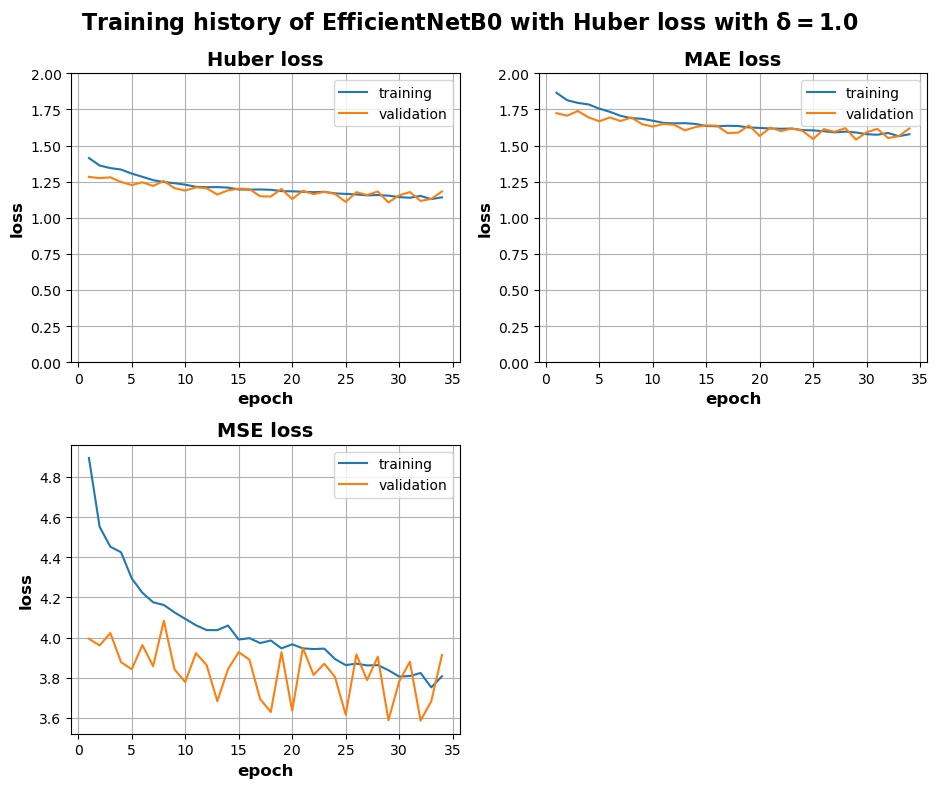

In [52]:
fig, ax = plt.subplots(2, 2, figsize=(9.5, 8))
ax = ax.flatten()

plot_loss_history(count_history_5.history, 'loss', 'Huber loss', yrange=(0, 2), ax=ax[0])
plot_loss_history(count_history_5.history, 'mae', 'MAE loss', yrange=(0, 2), ax=ax[1])
plot_loss_history(count_history_5.history, 'mse', 'MSE loss', yrange=None, ax=ax[2])
ax[3].axis('off')

plt.suptitle(r'Training history of EfficientNetB0 with Huber loss with $\mathbf{\delta=}$' +
             f'{Huber_delta}', fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

In [53]:
count_model_5.load_weights('saved_models/count_model_5.h5')

column_names_dict = {'loss':'Huber loss', 'mae':'MAE', 'mse':'MSE'}
display_evaluation_results(count_model_5, column_names_dict)

,Huber loss,MAE,MSE
0,1.1062,1.5412,3.58835


In [54]:
%%time

# Unfreezing layers except BatchNormalization
for layer in count_model_5.layers:
    if not isinstance(layer, layers.BatchNormalization):
        layer.trainable = True


# Exponential decay of the learning rate
lr_scheduler = lambda epoch, lr: 0.998**epoch * lr

callbacks = [keras.callbacks.EarlyStopping(monitor='val_loss', patience=5),
             keras.callbacks.LearningRateScheduler(lr_scheduler, verbose=0),
             keras.callbacks.ModelCheckpoint('saved_models/count_model_5.h5', monitor='val_loss',
                                             save_best_only=True, save_weights_only=True)]


Huber_delta = 1.0
count_model_5.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=1e-10),
                      loss=keras.losses.Huber(delta=Huber_delta), metrics=['mae', 'mse'])

count_history_5 = count_model_5.fit(count_aug_train_X,
                                    count_train_y,
                                    batch_size=32,
                                    epochs=20,
                                    shuffle=True,
                                    validation_data=(count_val_X, count_val_y),
                                    callbacks=callbacks,
                                    verbose=1)

Epoch 1/20
202/202 [==============================] - 104s 496ms/step - loss: 6.8760 - mae: 7.3522 - mse: 126.1185 - val_loss: 2873.2625 - val_mae: 2873.7617 - val_mse: 19907330.0000 - lr: 1.0000e-10
Epoch 2/20
202/202 [==============================] - 101s 501ms/step - loss: 6.9513 - mae: 7.4299 - mse: 126.4500 - val_loss: 5345.7568 - val_mae: 5346.2559 - val_mse: 56561820.0000 - lr: 9.9800e-11
Epoch 3/20
202/202 [==============================] - 100s 494ms/step - loss: 6.8617 - mae: 7.3411 - mse: 122.8154 - val_loss: 2819.3352 - val_mae: 2819.8342 - val_mse: 24598214.0000 - lr: 9.9401e-11
Epoch 4/20
202/202 [==============================] - 101s 498ms/step - loss: 6.8546 - mae: 7.3295 - mse: 123.9094 - val_loss: 1954.6984 - val_mae: 1955.1970 - val_mse: 18317670.0000 - lr: 9.8806e-11
Epoch 5/20
202/202 [==============================] - 99s 491ms/step - loss: 6.8881 - mae: 7.3642 - mse: 125.9261 - val_loss: 1286.5630 - val_mae: 1287.0602 - val_mse: 10672043.0000 - lr: 9.8018e-11
E

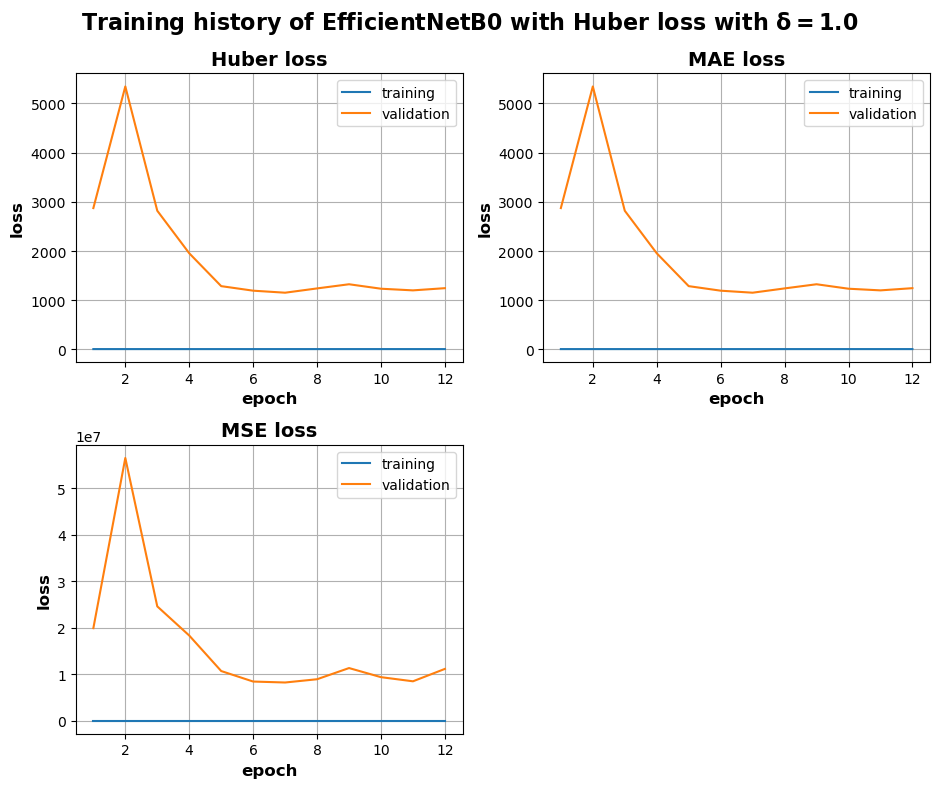

In [55]:
fig, ax = plt.subplots(2, 2, figsize=(9.5, 8))
ax = ax.flatten()

plot_loss_history(count_history_5.history, 'loss', 'Huber loss', yrange=None, ax=ax[0])
plot_loss_history(count_history_5.history, 'mae', 'MAE loss', yrange=None, ax=ax[1])
plot_loss_history(count_history_5.history, 'mse', 'MSE loss', yrange=None, ax=ax[2])
ax[3].axis('off')

plt.suptitle(r'Training history of EfficientNetB0 with Huber loss with $\mathbf{\delta=}$' +
             f'{Huber_delta}', fontproperties={'size':16, 'weight':'bold'})
plt.tight_layout()
plt.show()

In [56]:
count_model_5.load_weights('saved_models/count_model_5.h5')

column_names_dict = {'loss':'Huber loss', 'mae':'MAE', 'mse':'MSE'}
display_evaluation_results(count_model_5, column_names_dict)

,Huber loss,MAE,MSE
0,1153.052,1153.5498,8203917.5


<a id='part2'></a>
<div style="background-color:#3B9050; padding: 8px; border-radius: 5px; font-size: 25px;">
<b style="color: white;">Part 2: Apple detection</b>
</div>

Let us download and inspect the images for the image segmentation task.

In [57]:
%%time
segment_train_imgs = extract_imgs_from_dir('data/detection/train/images')
segment_train_masks = extract_imgs_from_dir('data/detection/train/masks')

segment_test_imgs = extract_imgs_from_dir('data/detection/test/images')

CPU times: user 26.6 s, sys: 1.47 s, total: 28.1 s
Wall time: 32 s


In [58]:
segment_train_img_keys = sorted(list(segment_train_imgs.keys()))


printbf(f'Keys of images and masks agree: {segment_train_imgs.keys() == segment_train_masks.keys()}')

Keys of images and masks agree: True


Also, let us check the number of training and test images and plot some of them together with their masks.

In [59]:
segment_train_n = len(segment_train_imgs)
segment_test_n = len(segment_test_imgs)


printbf(f'Number of training images: {segment_train_n}')
printbf(f'Number of test images: {segment_test_n}')

Number of training images: 670
Number of test images: 331


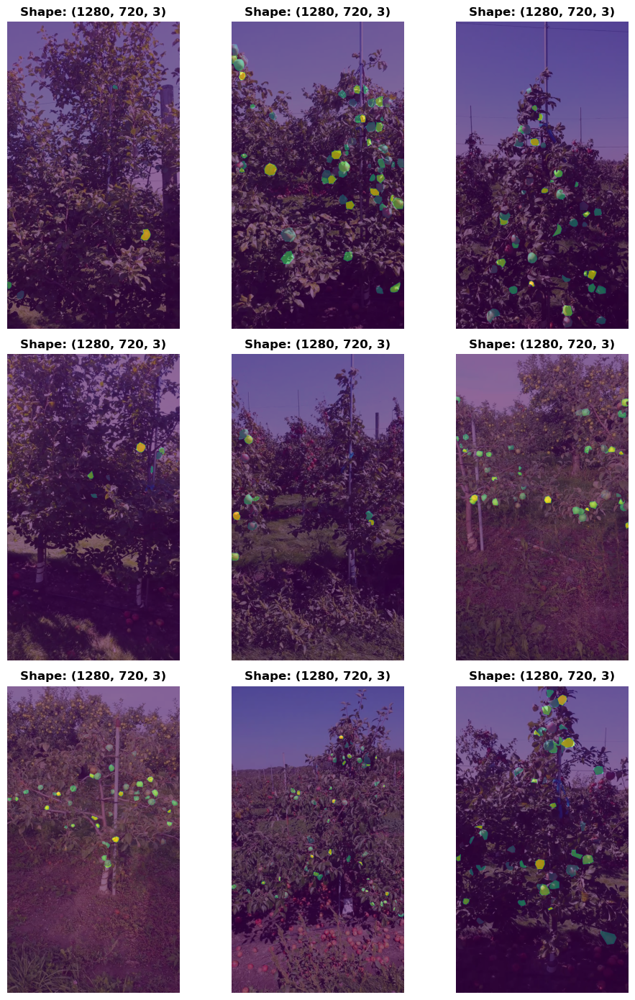

In [60]:
sample_keys = list(segment_train_imgs.keys())[:9]


fig, ax = plt.subplots(3, 3, figsize=(10, 14))
ax = ax.flatten()

for i, key in enumerate(sample_keys):
    sample_image = segment_train_imgs[key]
    sample_mask = segment_train_masks[key]
    
    ax[i].imshow(sample_image)
    ax[i].imshow(100*sample_mask, alpha=0.6)
    ax[i].axis('off')
    ax[i].set_title(f'Shape: {sample_image.shape}', fontdict={'size':12, 'weight':'bold'})

plt.tight_layout()
plt.show()

We can see that all images and masks have the same shape, and so no resizing is needed.

Now let us combine the training images and masks into arrays.

In [61]:
%%time

segment_shape = sample_image.shape


segment_train_X = np.empty((segment_train_n, *segment_shape), dtype='int')
segment_train_y = np.empty((segment_train_n, *segment_shape[:2]), dtype='int')


for i, key in enumerate(segment_train_img_keys):
    segment_train_X[i] = segment_train_imgs[key]
    segment_train_y[i] = segment_train_masks[key]

CPU times: user 1.39 s, sys: 2.9 s, total: 4.28 s
Wall time: 7.5 s


Let us also check the unique pixel values of the masks.

In [62]:
np.unique(segment_train_y[0])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95])

In [63]:
printbf(f'Maximal number of apples in a mask: {np.max(segment_train_y)}')

Maximal number of apples in a mask: 123


We see that pixels corresponding to different apples have different values and that there can be more than one hundred apples in a mask. In order to simplify the task, we are going to classify pixels into only two classes - apples and not apples.

In [64]:
segment_train_y = 1 * (segment_train_y > 0)


printbf(f'Unique pixel values: {np.unique(segment_train_y)}')

Unique pixel values: [0 1]


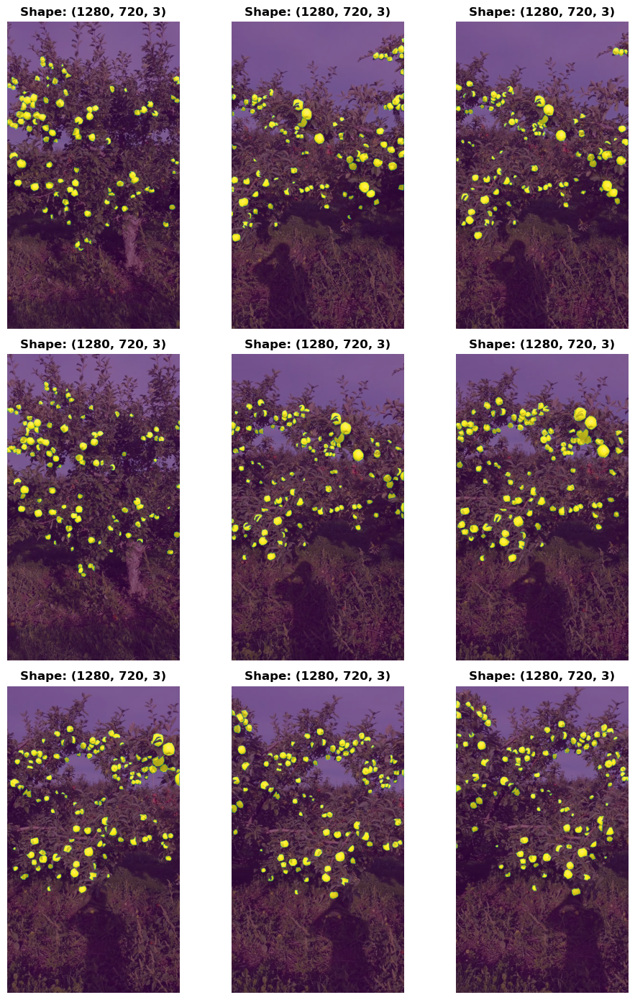

In [65]:
sample_idxs = range(9)


fig, ax = plt.subplots(3, 3, figsize=(10, 14))
ax = ax.flatten()

for i, idx in enumerate(sample_idxs):
    sample_image = segment_train_X[idx]
    sample_mask = segment_train_y[idx]
    
    ax[i].imshow(sample_image)
    ax[i].imshow(100*sample_mask, alpha=0.6)
    ax[i].axis('off')
    ax[i].set_title(f'Shape: {sample_image.shape}', fontdict={'size':12, 'weight':'bold'})

plt.tight_layout()
plt.show()

The code from [the Keras example notebook](https://keras.io/examples/vision/oxford_pets_image_segmentation/) was used as a template to create the code below.

In [66]:
# Number of classes of pixels
num_classes = 2


def UNet(input_shape, model_name):
    inputs = keras.Input(shape=input_shape, name='Input')
    
    # Downsampling inputs
    x = layers.Conv2D(32, 3, strides=2, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    
    previous_block_activation = x # Set aside residual
    
    # Blocks 1, 2, 3 are identical apart from the feature depth
    for filters in [32, 64]:
        x = layers.Activation('relu')(x)
        
        x = layers.SeparableConv2D(filters, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        
        x = layers.SeparableConv2D(filters, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        
        x = layers.MaxPooling2D(3, strides=2, padding='same')(x)
        
        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding='same')(previous_block_activation)
        x = layers.add([x, residual]) # Add back residual
        previous_block_activation = x # Set aside next residual
    
    # Upsampling inputs
    for filters in [64, 32, 16]:
        x = layers.Activation('relu')(x)
        
        x = layers.Conv2DTranspose(filters, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        
        x = layers.Conv2DTranspose(filters, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        
        x = layers.UpSampling2D(2)(x)
        
        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding='same')(residual)
        x = layers.add([x, residual]) # Add back residual
        previous_block_activation = x # Set aside next residual
    
    # Add a per-pixel classification layer
    outputs = layers.Conv2D(num_classes, 3, activation='softmax', padding='same')(x)
    
    # Model
    model = keras.Model(inputs=inputs, outputs=outputs, name=model_name)
    
    return model

In [67]:
segment_model = UNet(input_shape=segment_shape, model_name='UNet')
segment_model.summary()

Model: "UNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 Input (InputLayer)          [(None, 1280, 720, 3)]       0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 640, 360, 32)         896       ['Input[0][0]']               
                                                                                                  
 batch_normalization (Batch  (None, 640, 360, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 640, 360, 32)         0         ['batch_normalization[0][0]

In [68]:
%%time

callbacks = [keras.callbacks.ModelCheckpoint('saved_models/segment_model.h5', monitor='loss',
                                             save_best_only=True, save_weights_only=True)]


segment_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=1e-4),
                      loss='sparse_categorical_crossentropy')

segment_history = segment_model.fit(segment_train_X,
                                    segment_train_y,
                                    batch_size=4,
                                    epochs=5,
                                    shuffle=True,
                                    callbacks=callbacks,
                                    verbose=1)

Epoch 1/5
168/168 [==============================] - 394s 2s/step - loss: 0.1208
Epoch 2/5
168/168 [==============================] - 361s 2s/step - loss: 0.0675
Epoch 3/5
168/168 [==============================] - 366s 2s/step - loss: 0.0559
Epoch 4/5
168/168 [==============================] - 362s 2s/step - loss: 0.0510
Epoch 5/5
168/168 [==============================] - 360s 2s/step - loss: 0.0477
CPU times: user 2h 12min 48s, sys: 40min 37s, total: 2h 53min 26s
Wall time: 31min 4s


In [69]:
segment_model.load_weights('saved_models/segment_model.h5')

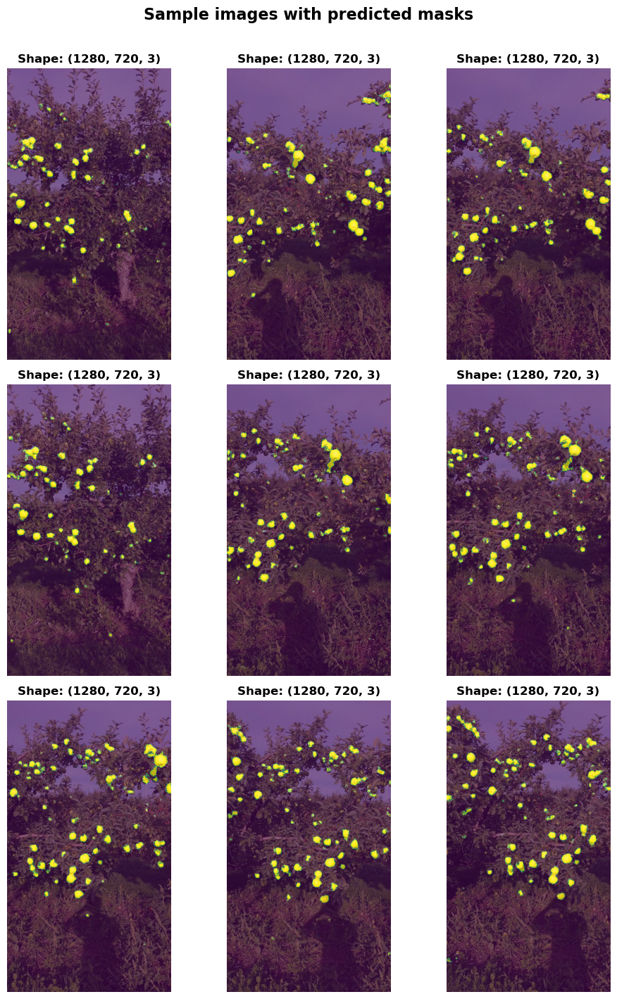

In [70]:
sample_idxs = range(9)


fig, ax = plt.subplots(3, 3, figsize=(10, 14))
ax = ax.flatten()

for i, idx in enumerate(sample_idxs):
    sample_image = segment_train_X[idx]
    predicted_mask = segment_model.predict(np.expand_dims(sample_image, axis=0), verbose=0)
    predicted_mask = np.argmax(np.squeeze(predicted_mask), axis=-1)
    
    ax[i].imshow(sample_image)
    ax[i].imshow(predicted_mask, alpha=0.6)
    ax[i].axis('off')
    ax[i].set_title(f'Shape: {sample_image.shape}', fontdict={'size':12, 'weight':'bold'})

plt.suptitle('Sample images with predicted masks', fontproperties={'size':16, 'weight':'bold'}, y=1.01)
plt.tight_layout()
plt.show()

As we can see, even after only five epochs of training, the model localizes apples rather accurately.